<a href="https://colab.research.google.com/github/vivian-xia/NLP_MovieReviews/blob/main/Assignment_1_First_Vectorized_Representation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### Vivian Xia

## MSDS453 - Research Assignment 01 - First Vectorized Representation

### Importing Packages

In [1]:
import pandas as pd
import os
import numpy as np
import random 
import re
import string
from packaging import version

from numpy import array
from numpy import argmax

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot

import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize 
from nltk.tokenize import RegexpTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk import ngrams, FreqDist

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, silhouette_score
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, KFold
from sklearn.manifold import TSNE

import gensim
from gensim.models import Word2Vec,LdaMulticore, TfidfModel
from gensim import corpora
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

<div class="alert alert-block alert-danger">
<b>Gensim</b> is a Python library for topic modelling, document indexing and similarity retrieval with large corpora. Target audience is the natural language processing (NLP) and information retrieval (IR) community <br><br>
    <b>https://pypi.org/project/gensim/ </b>
</div>

In [2]:
import pkg_resources
pkg_resources.require("gensim<=3.8.3");

In [3]:
print("Genism Version: ", gensim.__version__)

Genism Version:  3.6.0


### NLTK Downloads

In [4]:
# Only run this once, they will be downloaded.
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [5]:
import warnings
warnings.filterwarnings('ignore')

### Mount Google Drive to Colab Environment

In [6]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


### Functions

In [7]:
def get_corpus(path_to_file):
    #read in class corpus csv into python
    data=pd.read_csv(path_to_file)

    #create empty list to store text documents titles
    titles=[]
    docids=[]
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        docids.append(data['Doc_ID'].iloc[i])

    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        titles.append(data['DSI_Title'].iloc[i])

    #create empty list to store text documents
    text_body=[]

    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    return (docids,titles,text_body)

def process_corpus(data):
        
    #create empty list to store text documents titles
    titles=[]
    
    #for loop which appends the DSI title to the titles list
    for i in range(0,len(data)):
        temp_text=data['DSI_Title'].iloc[i]
        titles.append(temp_text)
    
    #create empty list to store text documents
    text_body=[]
    
    #for loop which appends the text to the text_body list
    for i in range(0,len(data)):
        temp_text=data['Text'].iloc[i]
        text_body.append(temp_text)
    
    #Note: the text_body is the unprocessed list of documents read directly form 
    #the csv.
        
    #empty list to store processed documents
    processed_text=[]
    #for loop to process the text to the processed_text list
    for i in text_body:
        text=clean_doc(i) #apply the data wrangling function
        processed_text.append(text)
    
    #Note: the processed_text is the PROCESSED list of documents read directly form 
    #the csv.  Note the list of words is separated by commas.
    
    
    #stitch back together individual words to reform body of text
    final_processed_text=[]
    
    for i in processed_text:
        temp_DSI=i[0]
        for k in range(1,len(i)):
            temp_DSI=temp_DSI+' '+i[k]
        final_processed_text.append(temp_DSI)
    
    return titles, final_processed_text, processed_text

In [8]:
#top 10 td-idf score terms
def top_term_scores():
  term=[]
  score=[]

  #import my 10 documents
  for doc in range(1,11): 
    path_to_docs='VXL_Doc{}_GuardiansOfTheGalaxy'.format(doc)
    data=pd.read_csv(path_to_docs)
    
    for i in data['term']:
        term.append(i)
    for i in data['score']:
        score.append(i)

  d = {'Term':term,'Score':score}
  term_score_df = pd.DataFrame(d)
  term_score_df = term_score_df[term_score_df['Score'] > 0]

  for i in term_score_df['Term']:
    scores = []
    for index, term in enumerate(term_score_df['Term']):
      
      if(i==term):
        scores.append(term_score_df['Score'].iloc[index])
    
    #print(i)
    #print(scores)  
    mean_score = sum(scores)/len(scores)

    term_score_df = term_score_df[term_score_df['Term'] != i]
    df2 = {'Term': i, 'Score': mean_score}
    term_score_df = term_score_df.append(df2, ignore_index = True)

  term_score_df = term_score_df.sort_values(by=['Score'], ascending=False)
  return term_score_df

In [9]:
#functions to create and plot doc2vec matrix
def run_doc2vec(final_processed_text, processed_text, dimension_size):
    #create doc2vec matrix
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(final_processed_text)]
    model = Doc2Vec(documents, vector_size=dimension_size, window=3, min_count=2, workers=4)    #doc2vec dimension size 100,200,300
    
    doc2vec_df=pd.DataFrame()
    for i in range(0,len(processed_text)):
        vector=pd.DataFrame(model.infer_vector(processed_text[i])).transpose()
        doc2vec_df=pd.concat([doc2vec_df,vector], axis=0)
        
    return doc2vec_df




def plot_doc2vec(doc2vec_df, titles,_perplexity=10):
    #visualize documents through applying TSNE to doc2vec matrix
    tsne_model = TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=2500, random_state=23)
    doc2vec_df = tsne_model.fit_transform(doc2vec_df)
    x = []
    y = []
    for value in doc2vec_df:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(titles[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
    

In [10]:
#functions to create and plot word2vec matrix
def run_word2vec(processed_text, dimension_size):

    #word to vec model
    model_w2v = Word2Vec(processed_text, size=dimension_size, window=3, min_count=2, workers=4)  #size=100,200,300 dimensions (each column is a feature) and every row is a word -- all dense vectors not 0 and 1
    
    labels = []
    tokens = []

    for word in model_w2v.wv.vocab:
        tokens.append(model_w2v[word])
        labels.append(word)
    
    
    return labels, tokens, model_w2v



def plot_word2vec(model, labels, tokens, _perplexity=30):
    "Creates and TSNE model and plots it"
    words = []
    embeddings = []
    for word in list(model.wv.vocab):
        embeddings.append(model.wv[word])
        words.append(word)

    tsne_model= TSNE(perplexity=_perplexity, n_components=2, init='pca', n_iter=3500, random_state=32)
    new_values = tsne_model.fit_transform(tokens)
    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(40, 40)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()


In [11]:
def remove_stop_words(in_text):
    stop_words = set(stopwords.words('english'))  #create list of stop words NLTK
    word_tokens = word_tokenize(in_text)  
    filtered_sentence = [w for w in word_tokens if not w in stop_words] 
    filtered_sentence = [] 
    for w in word_tokens: 
        if w not in stop_words: 
            filtered_sentence.append(w) 

    return filtered_sentence


def apply_stemming(in_text):
    stemmer=PorterStemmer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([stemmer.stem(w) for w in word_list])
    return output


def apply_lemmatization(in_text):
    # Lemmatization
    lem = WordNetLemmatizer()
    word_list = nltk.word_tokenize(in_text)
    output = ' '.join([lem.lemmatize(w) for w in word_list])
    return output

# Method 1 Experiments



## Data wrangling
baseline = tokenization + normalization

### Source Class Corpus


In [12]:
import os
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')

path_to_file='ClassCorpus.csv'
docids,titles,text=get_corpus(path_to_file)
print(titles)

['HAG_Doc1_Frozen2', 'HAG_Doc2_Frozen2', 'HAG_Doc3_Frozen2', 'HAG_Doc4_Frozen2', 'HAG_Doc5_Frozen2', 'HAG_Doc6_Frozen2', 'HAG_Doc7_Frozen2', 'HAG_Doc8_Frozen2', 'HAG_Doc9_Frozen2', 'HAG_Doc10_Frozen2', 'RIA_Doc1_SpiderMan3', 'RIA_Doc2_SpiderMan3', 'RIA_Doc3_SpiderMan3', 'RIA_Doc4_SpiderMan3', 'RIA_Doc5_SpiderMan3', 'RIA_Doc6_SpiderMan3', 'RIA_Doc7_SpiderMan3', 'RIA_Doc8_SpiderMan3', 'RIA_Doc9_SpiderMan3', 'RIA_Doc10_SpiderMan3', 'CAA_Doc1_Cruella', 'CAA_Doc2_Cruella', 'CAA_Doc3_Cruella', 'CAA_Doc4_Cruella', 'CAA_Doc5_Cruella', 'CAA_Doc6_Cruella', 'CAA_Doc7_Cruella', 'CAA_Doc8_Cruella', 'CAA_Doc9_Cruella', 'CAA_Doc10_Cruella', 'AAT_Doc1_TheMatrixResurrecton', 'AAT_Doc2_TheMatrixResurrecton', 'AAT_Doc3_TheMatrixResurrecton', 'AAT_Doc4_TheMatrixResurrecton', 'AAT_Doc5_TheMatrixResurrecton', 'AAT_Doc6_TheMatrixResurrecton', 'AAT_Doc7_TheMatrixResurrecton', 'AAT_Doc8_TheMatrixResurrecton', 'AAT_Doc9_TheMatrixResurrecton', 'AAT_Doc10_TheMatrixResurrecton', 'BARRYC_Doc1_GroundhogDay', 'BARRYC

### Functions for pre-processing

In [13]:
def clean_doc(doc): 
    #split document into individual words
    #doc = ' '.join(remove_stop_words(doc))
    #doc = apply_lemmatization(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [14]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [15]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)
print(final_processed_text[0])

parents breathe sigh relief frozen showstopper into unknown isnt aggressive earworm more lyrically complex with more high notes kind thatll break your eardrums sung anyone isnt idina menzel hard imagine full kids howling such delicate scale hours upon hours frozen disneys sequel 13bn more mature ambitious intricate than predecessor that doesnt automatically make better frozens success built simple relatable story sisterly love different enough feel like stale rerun there surprises here uncover renewed sense energy proceedings admittedly film does play with fire taking same path other sequels padding characters backstory hope itll depth their world there echoes last months maleficent mistress evil queen elsa menzel carted magical place that might provide answers about where comes from frozen succeeds where many others have failed sentient snowman olaf josh himself neatly summarises scene elsa made peace with powers frozen when discovered that love rules over arendelle while anna kristen

##Document Vectorization using tf-idf

### Retrieve Word Count Frequencies

In [16]:
vectorizer = CountVectorizer(ngram_range = (1,1))
matrix=vectorizer.fit_transform(text)     

#creating datafram from TFIDF Matrix
words = vectorizer.get_feature_names()
matrix=pd.DataFrame(matrix.toarray(), columns=vectorizer.get_feature_names(), index=titles)
frequencies = matrix.sum().transpose().reset_index()
frequencies.columns = ['word', 'counts']
frequencies.head(10)

,word,counts
0,00,2
1,000,2
2,007,20
3,007s,1
4,10,35
5,100,7
6,1000,1
7,1000000,1
8,101,10
9,103,1


### Calculates TFIDF and Saves TFIDF Values for Terms

In [17]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))

In [18]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
1615,guardians,20.576739
112,ideological,20.540666
1614,galaxy,14.752990
113,formulaic,14.736069
1386,marvel,14.452042
1746,quill,13.594155
594,prologue,12.656627
326,flying,12.656627
114,values,12.370697
1619,orb,11.891650


## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [19]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

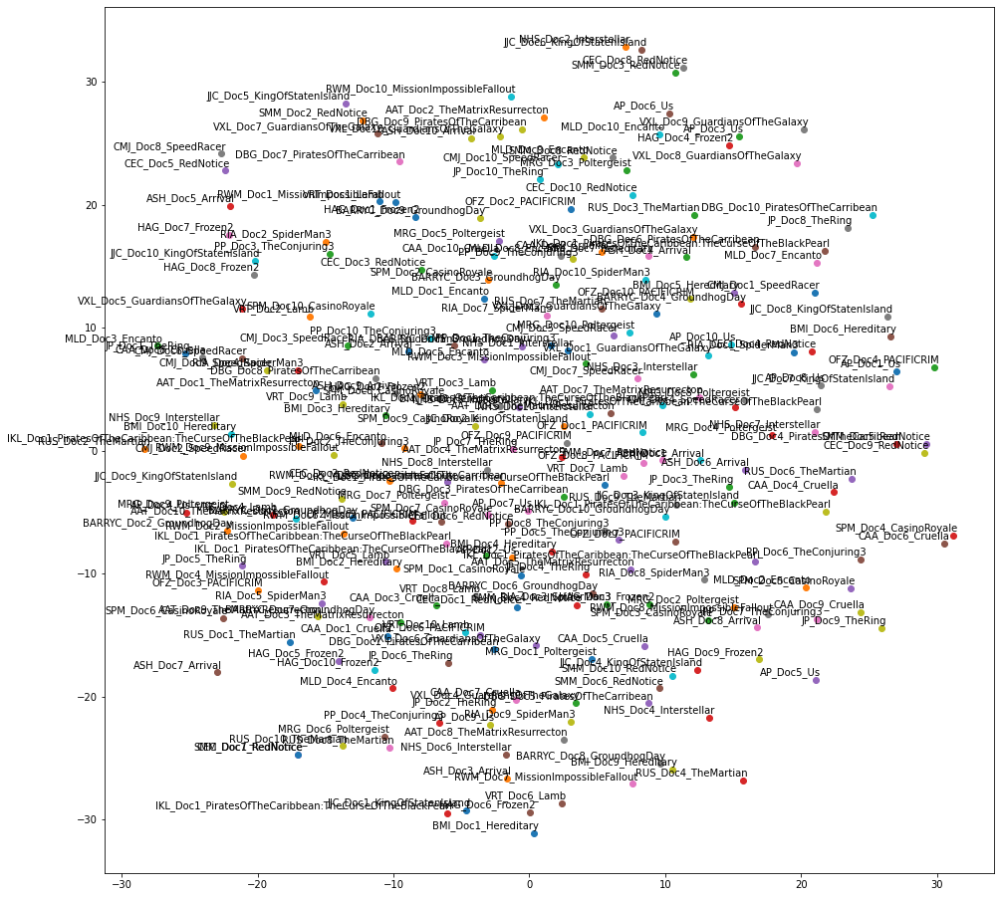

In [20]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [21]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

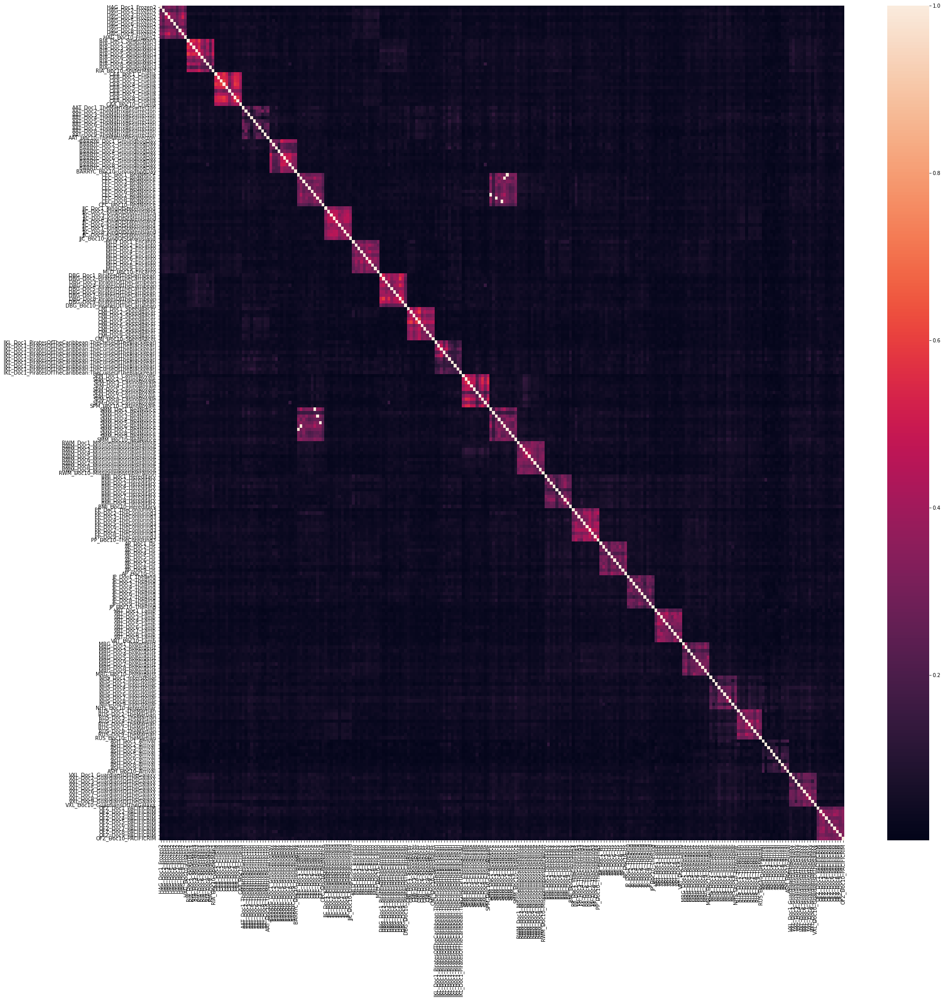

In [22]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [23]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

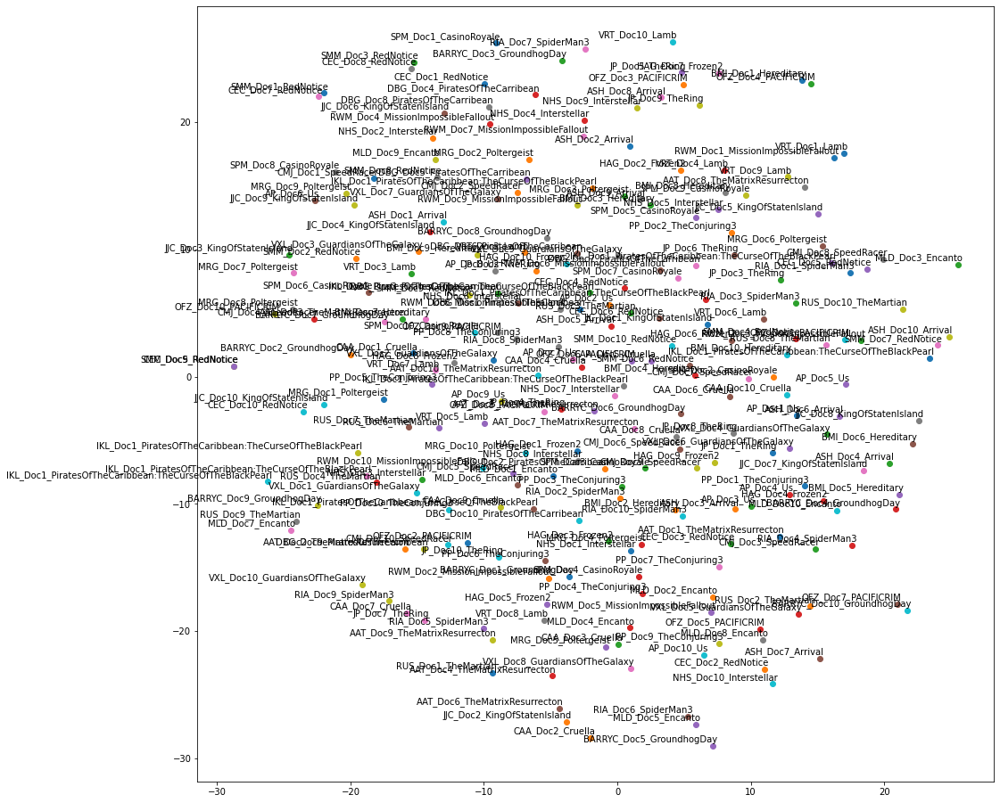

In [24]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [25]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

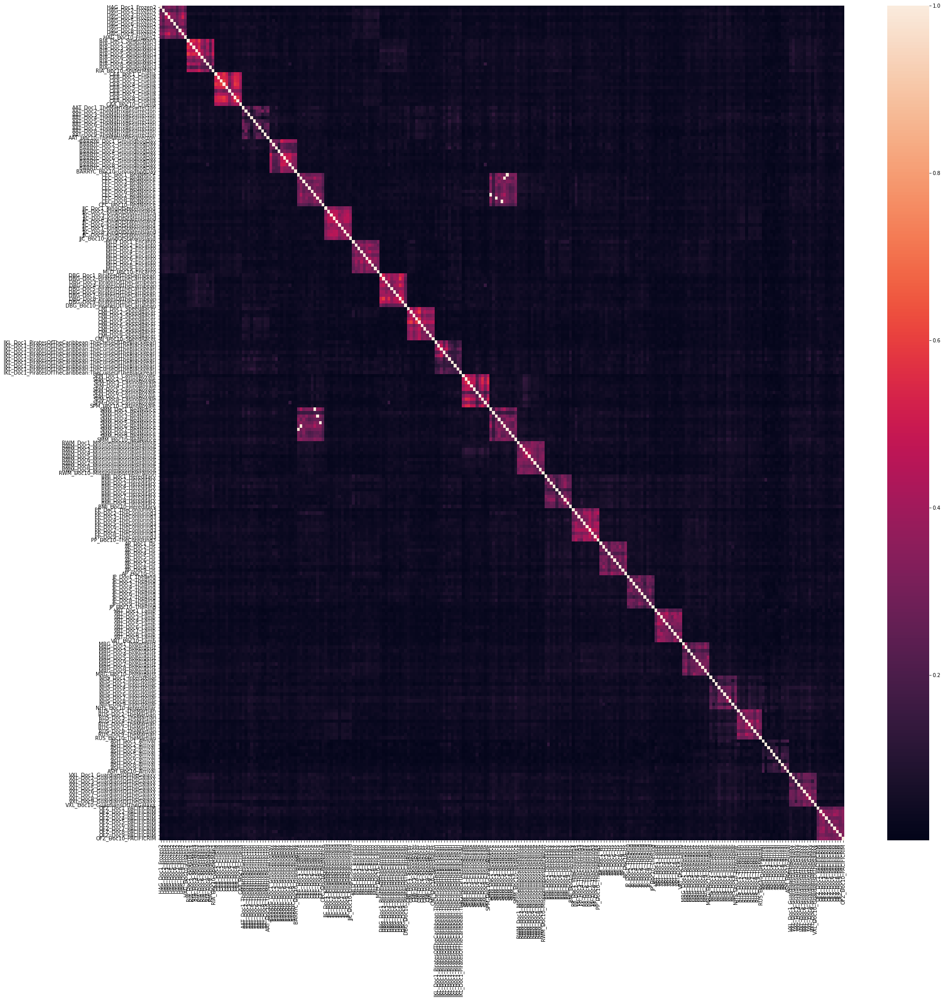

In [26]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [27]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

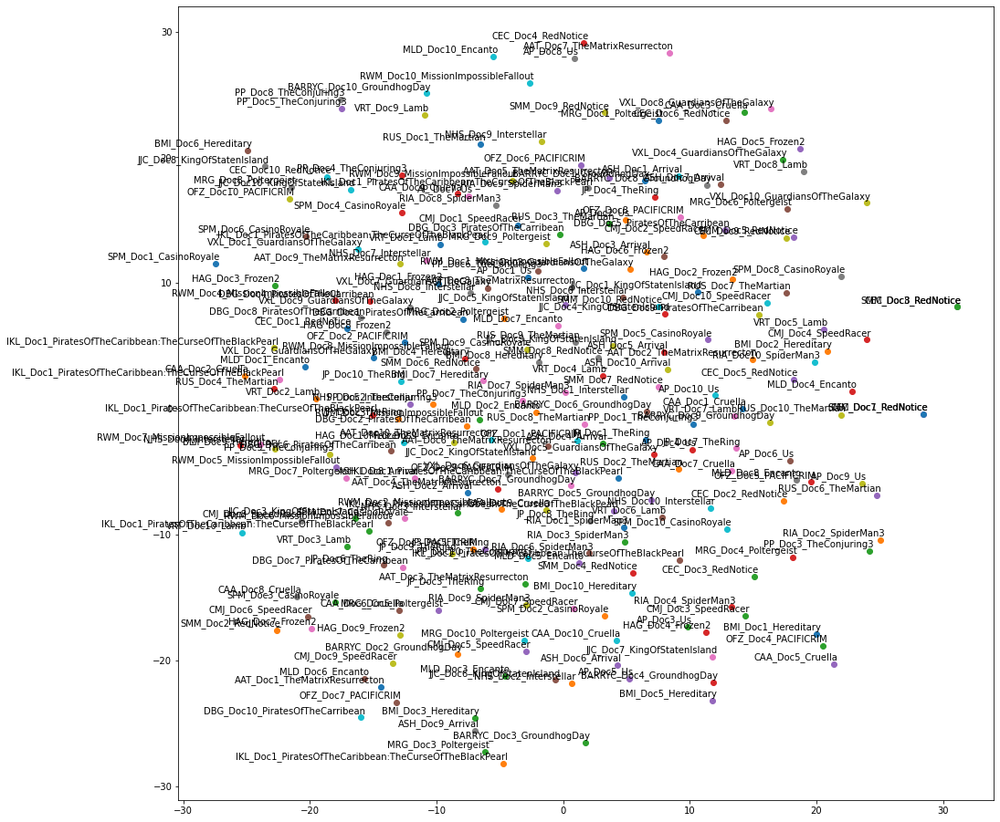

In [28]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [29]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

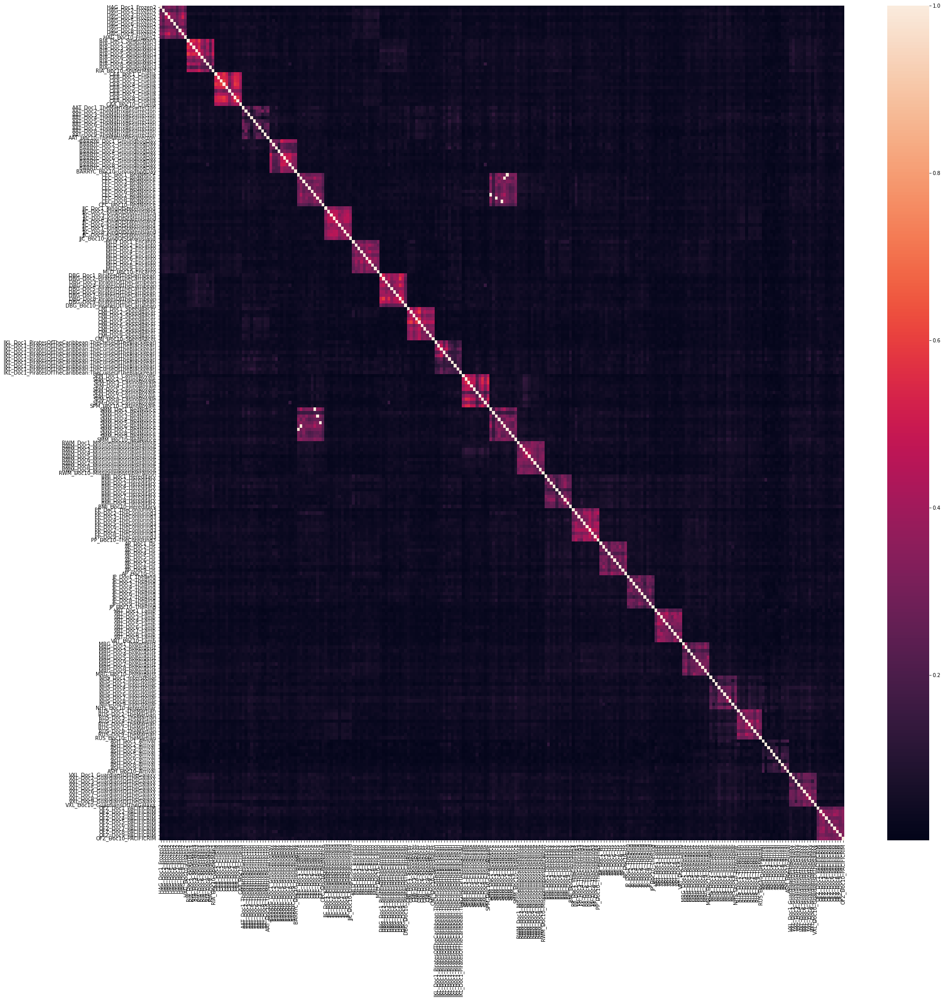

In [30]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [31]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [32]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

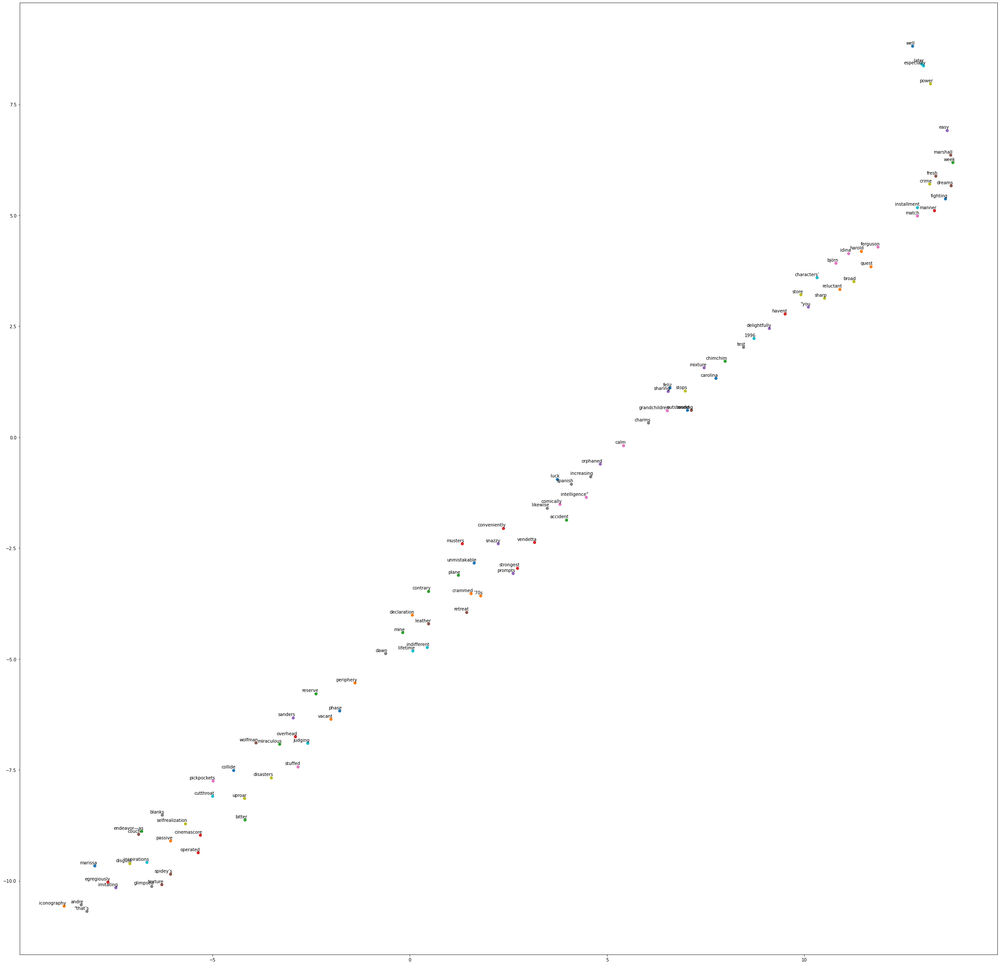

CPU times: user 2.77 s, sys: 145 ms, total: 2.91 s
Wall time: 2.35 s


In [33]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [34]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
marissa,0.011756,0.013914,-0.018128,0.003131,-0.002575,0.003872,-0.003559,0.006442,0.016432,-0.005622,0.004440,0.004590,0.005542,-0.011178,0.007381,0.000478,-0.000859,-0.003148,0.009021,-0.001706,0.005205,0.002757,0.000394,0.012436,-0.005146,-0.002599,0.005923,-0.001098,-0.007006,-0.003312,0.002604,0.003735,-0.007116,0.008508,-0.006536,0.002139,0.000553,0.013809,-0.010925,-0.002208,...,-0.007772,-0.008300,0.010887,-0.001303,0.000115,0.002712,-0.012610,-0.002425,0.010543,0.011389,-0.001868,0.000306,0.008044,0.010959,-0.004596,0.011620,0.002940,-0.001506,0.014319,-0.006953,0.026811,-0.005372,0.007081,-0.009700,0.005690,0.008183,0.014282,-0.014433,-0.014424,-0.005097,0.015642,0.008205,-0.000609,-0.001061,0.006360,0.019111,0.009467,-0.005615,0.000395,0.000555
iconography,0.005359,0.000836,-0.004312,0.003158,-0.003254,0.003145,0.000620,0.007883,0.007820,0.003863,0.002136,-0.002734,0.004569,-0.005130,0.004010,0.002829,-0.000411,-0.002541,0.002832,0.003202,0.002272,0.004347,-0.001111,0.008462,0.000312,0.002733,0.006018,-0.003300,0.002418,0.001910,-0.001306,0.000461,-0.003004,0.000863,-0.008446,0.000740,0.000167,0.008493,-0.003853,0.003070,...,-0.009134,-0.009507,0.006528,-0.000063,0.001309,-0.001604,-0.009869,0.002941,0.001913,0.001080,-0.004347,-0.002174,0.005561,0.002736,-0.004108,-0.000628,-0.000761,-0.003007,0.009224,-0.004796,0.017054,-0.001459,-0.001968,-0.004735,-0.000521,0.004765,0.002256,-0.003492,-0.005912,-0.006963,0.008907,-0.000245,-0.002901,0.002718,-0.002615,0.013284,0.007009,-0.003502,0.001234,-0.005880
miraculous,0.020153,0.018330,-0.030168,0.000239,-0.000092,-0.000389,-0.005110,0.016624,0.022260,-0.003014,0.019835,-0.000406,0.018772,-0.022251,0.008798,-0.007685,-0.004678,-0.000862,0.009130,0.006618,0.011681,0.005167,0.006421,0.029539,-0.014666,-0.003508,0.015704,0.001336,-0.005572,-0.002510,0.003912,-0.001047,-0.011113,0.005275,-0.021659,0.005134,0.000690,0.014049,-0.023915,0.006316,...,-0.018731,-0.011907,0.015082,-0.004366,0.007516,0.009197,-0.011722,0.002170,0.013449,0.010587,-0.000281,0.000452,0.015767,0.013823,-0.001180,0.015469,-0.003799,0.001508,0.016085,-0.004876,0.039277,-0.013581,0.005278,-0.004119,0.008356,0.010660,0.024372,-0.026098,-0.017656,-0.010309,0.031568,0.014896,0.001663,0.000471,0.000039,0.023919,0.015638,-0.018910,0.002956,-0.005301
manner,0.104489,0.104441,-0.160220,-0.010383,0.006968,0.011177,-0.035086,0.091048,0.150124,-0.016174,0.094998,0.006259,0.108399,-0.139261,0.072737,-0.038592,-0.039909,-0.016139,0.068367,0.031208,0.063429,0.054976,0.024881,0.166396,-0.084639,-0.016075,0.099982,0.032379,-0.044331,-0.001281,-0.000961,0.016188,-0.058757,0.052143,-0.109823,0.055331,-0.008809,0.095997,-0.120539,0.023869,...,-0.085925,-0.092843,0.084393,-0.038788,0.046527,0.047669,-0.107382,-0.015812,0.067646,0.071160,-0.008079,-0.024388,0.090863,0.092805,-0.037696,0.082840,-0.003341,0.001176,0.124256,-0.022341,0.261126,-0.087543,0.024523,-0.050064,0.063753,0.043167,0.126069,-0.140218,-0.123391,-0.063304,0.214518,0.086107,-0.005798,0.020886,0.029240,0.164536,0.099695,-0.112049,0.022816,-0.018721
mixture,0.037441,0.041276,-0.061928,-0.006158,0.000351,0.008021,-0.018001,0.039818,0.057657,-0.012175,0.037112,-0.001472,0.042308,-0.049918,0.032403,-0.016946,-0.020111,-0.004614,0.031657,0.013923,0.023891,0.022773,0.010482,0.062228,-0.032631,-0.003213,0.039887,0.013764,-0.013792,0.003898,-0.002935,0.005017,-0.025891,0.021599,-0.040647,0.021148,-0.001113,0.037857,-0.051234,0.013741,...,-0.035241,-0.033939,0.036070,-0.012954,0.015321,0.014354,-0.036059,-0.005563,0.029429,0.033820,-0.002469,-0.012966,0.029367,0.036929,-0.012063,0.029684,-0.000366,0.003677,0.050841,-0.011548,0.100609,-0.033116,0.009110,-0.020308,0.024353,0.017226,0.047942,-0.053455,-0.045807,-0.027542,0.086950,0.034347,0

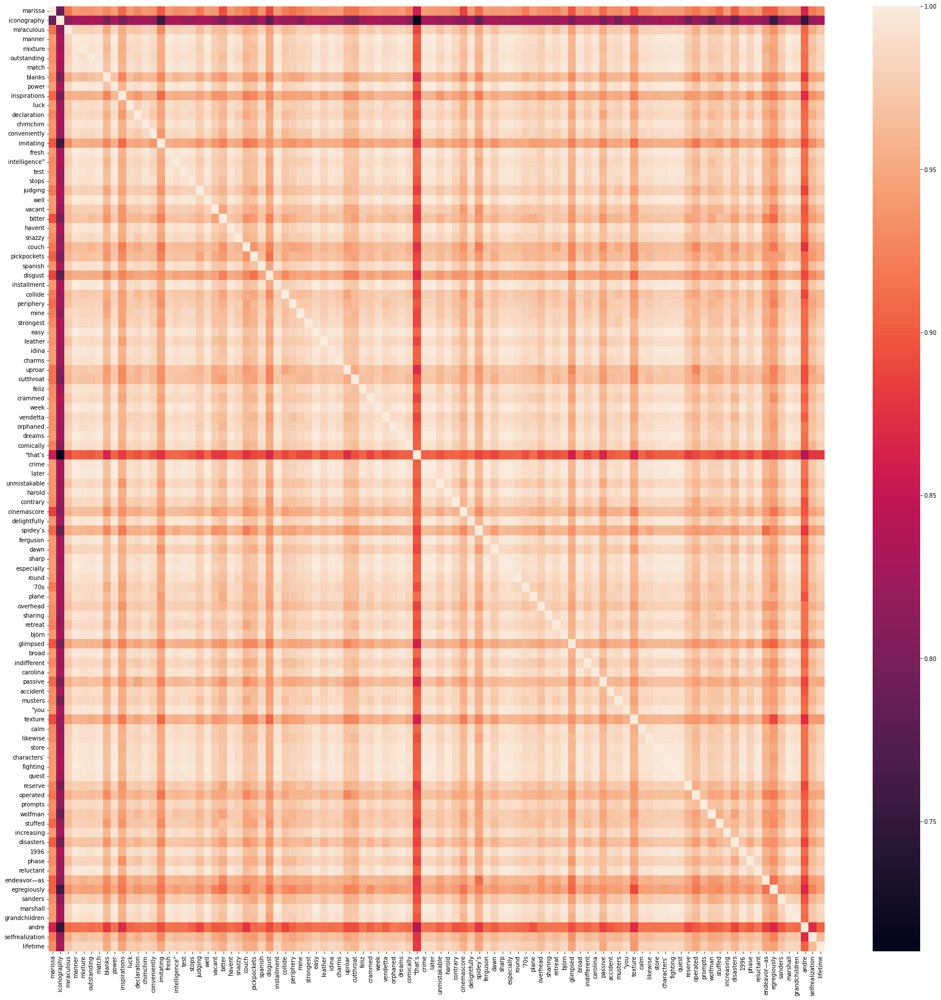

In [35]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [36]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [37]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

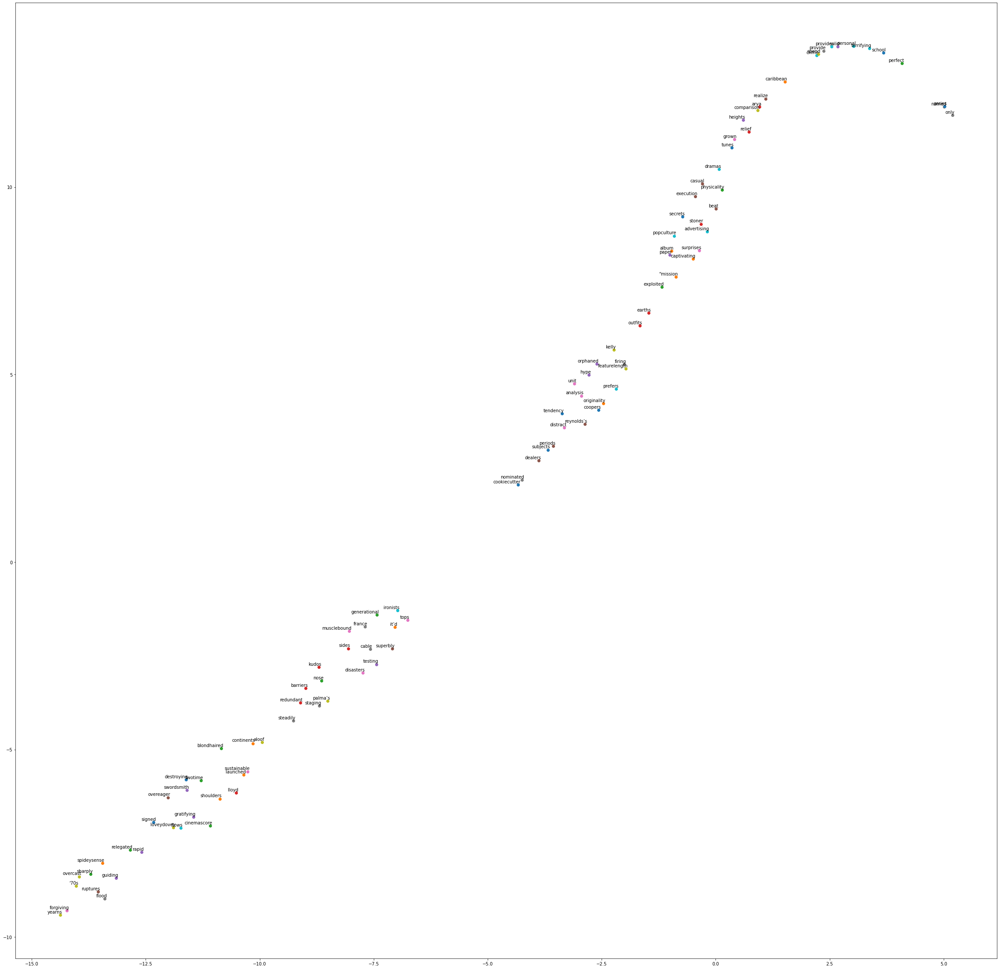

CPU times: user 2.7 s, sys: 154 ms, total: 2.86 s
Wall time: 2.27 s


In [38]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

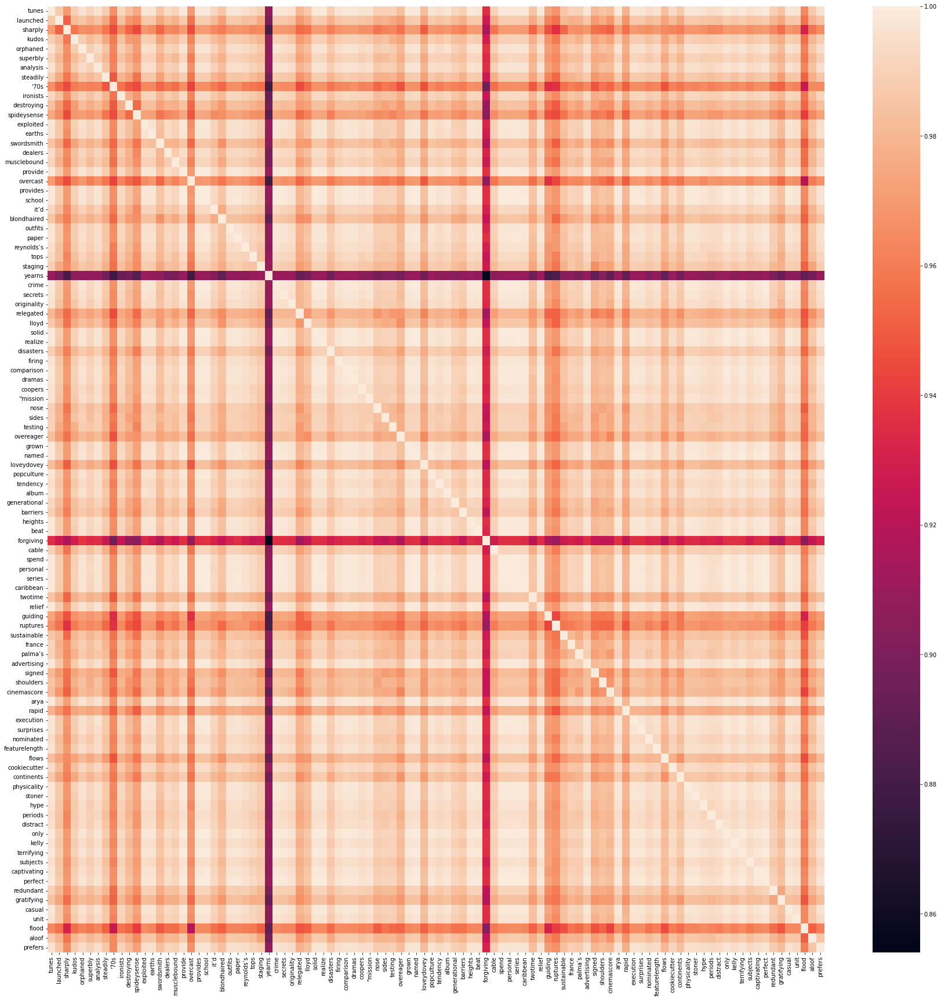

In [39]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [40]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [41]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

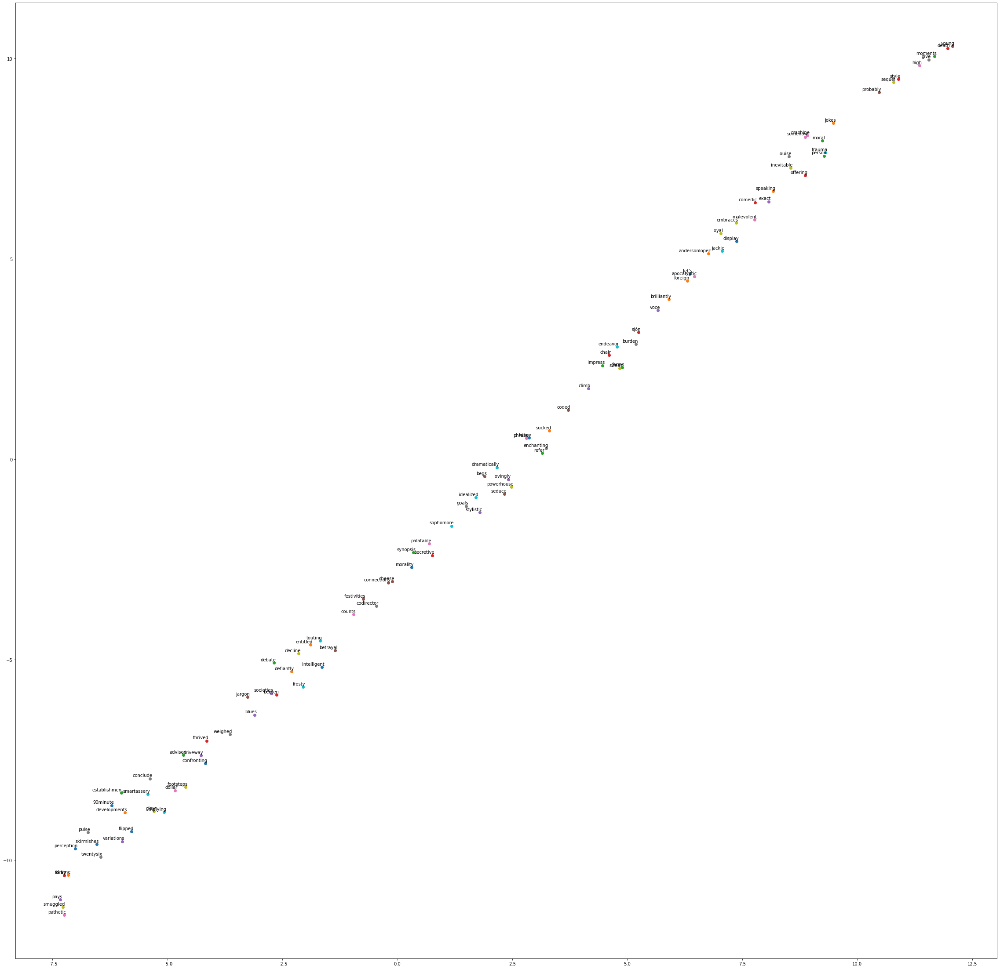

CPU times: user 2.61 s, sys: 138 ms, total: 2.74 s
Wall time: 2.21 s


In [42]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

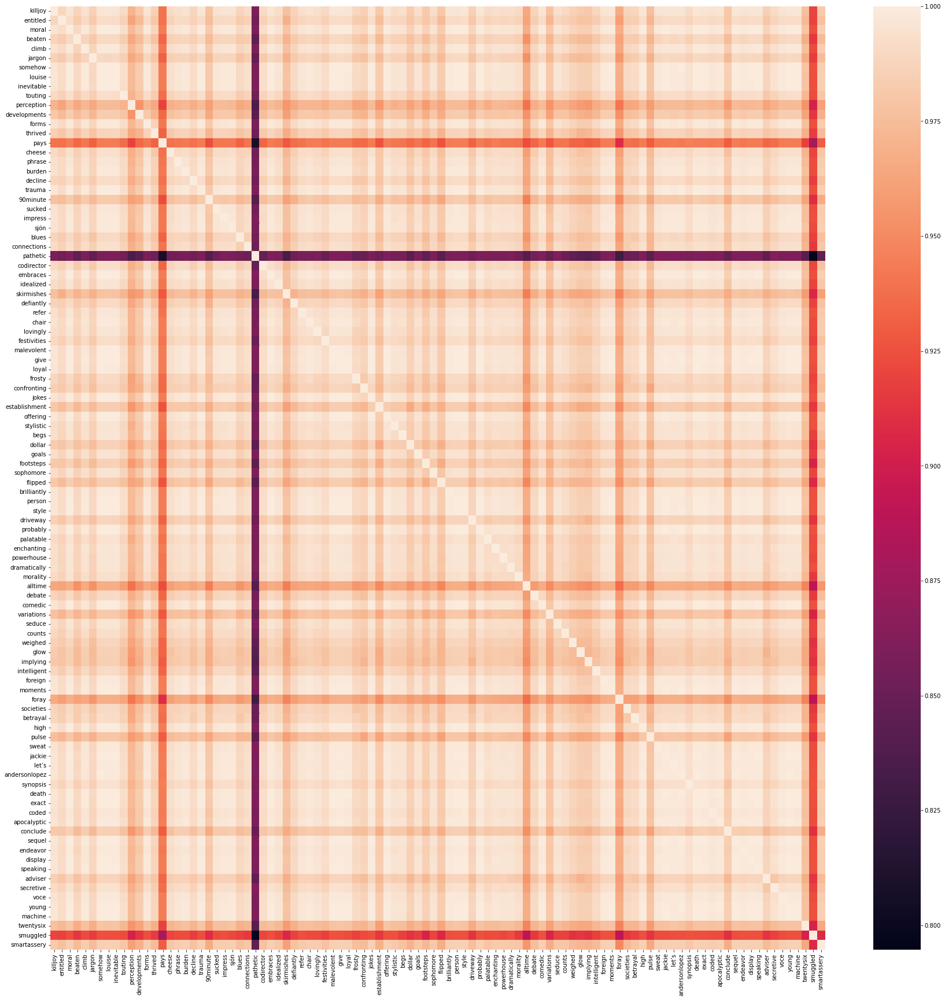

In [43]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

# Method 2 Experiments



## Data wrangling
baseline = tokenization + normalization + stemming + stop words

### Functions for pre-processing

In [44]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_stemming(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [45]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [46]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)
print(final_processed_text[0])

parent breath sigh relief frozen showstopp into unknown isnt aggress earworm lyric complex high note kind thatll break eardrum sung anyon isnt idina menzel hard imagin full howl delic scale hour upon hour frozen disney sequel 13bn matur ambiti intric predecessor that doesnt automat make better frozen success built simpl relat stori sisterli love differ enough feel like stale rerun there surpris uncov renew sens energi proceed admittedli film play fire take path sequel charact backstori hope itll depth world there echo last month malefic mistress evil queen elsa menzel cart magic place might provid answer come frozen succe mani other fail sentient snowman olaf josh neatli summaris scene elsa made peac power frozen discov love rule arendel anna kristen bell boyfriend kristoff jonathan groff provid sens domest normalci weekli charad session that mysteri femal voic provid norwegian singer aurora pierc quiet shake elsa soul someon look greater purpos beyond castl wall anyon hope disney fina

##Document Vectorization using tf-idf

### Retrieve Word Count Frequencies

In [47]:
vectorizer = CountVectorizer(ngram_range = (1,1))
matrix=vectorizer.fit_transform(text)     

#creating datafram from TFIDF Matrix
words = vectorizer.get_feature_names()
matrix=pd.DataFrame(matrix.toarray(), columns=vectorizer.get_feature_names(), index=titles)
frequencies = matrix.sum().transpose().reset_index()
frequencies.columns = ['word', 'counts']
frequencies.head(10)

,word,counts
0,00,2
1,000,2
2,007,20
3,007s,1
4,10,35
5,100,7
6,1000,1
7,1000000,1
8,101,10
9,103,1


### Calculates TFIDF and Saves TFIDF Values for Terms

In [48]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [49]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
1615,guardians,20.576739
112,ideological,20.540666
1614,galaxy,14.752990
113,formulaic,14.736069
1386,marvel,14.452042
1746,quill,13.594155
594,prologue,12.656627
326,flying,12.656627
114,values,12.370697
1619,orb,11.891650


## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [50]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

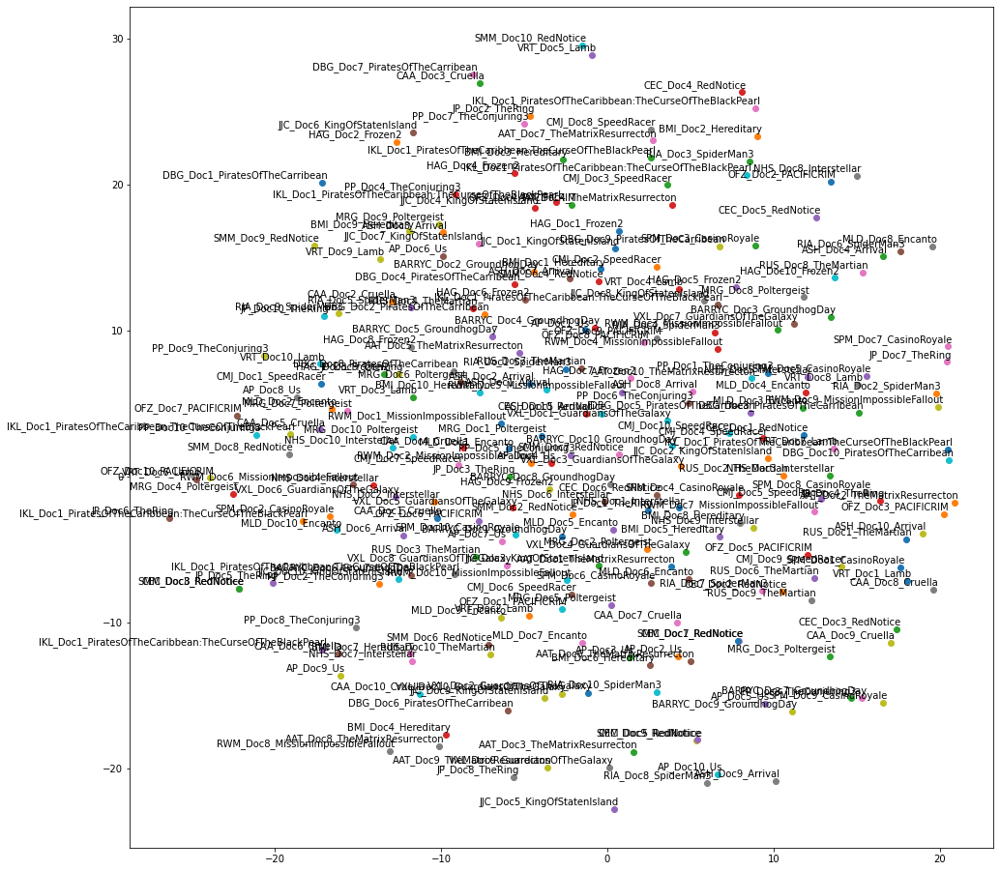

In [51]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [52]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

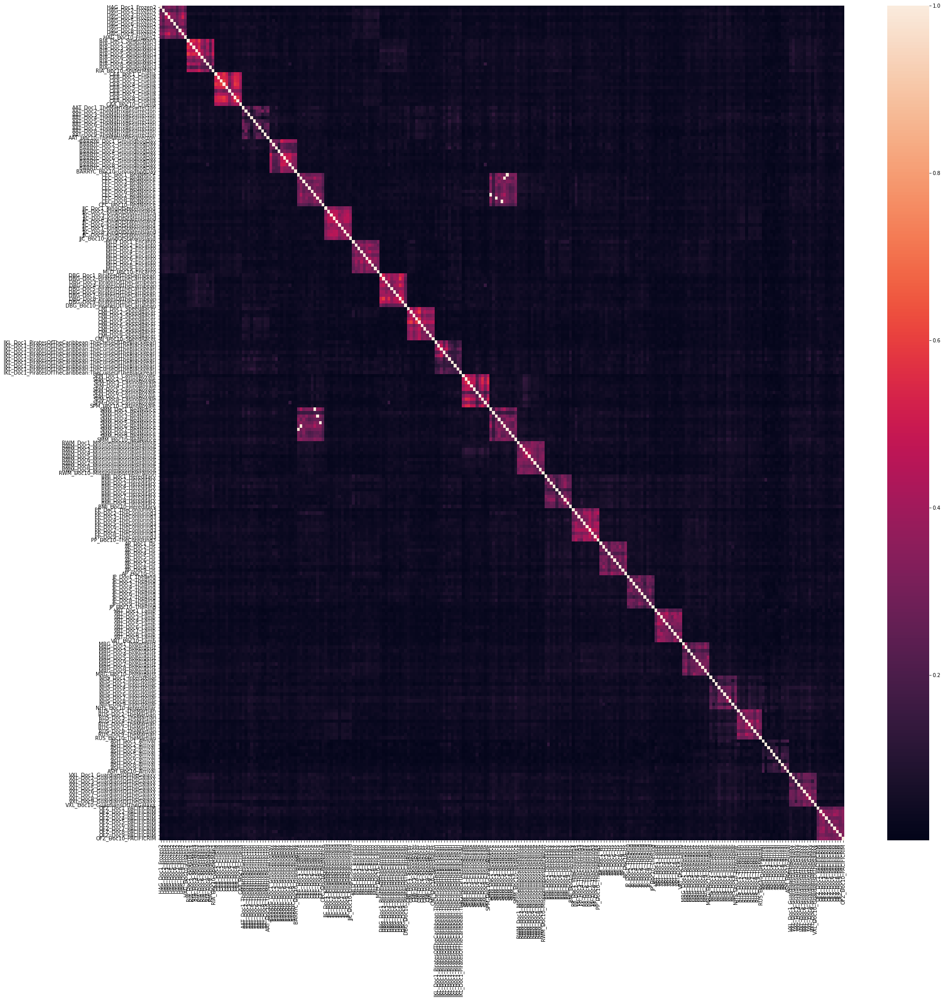

In [53]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [54]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

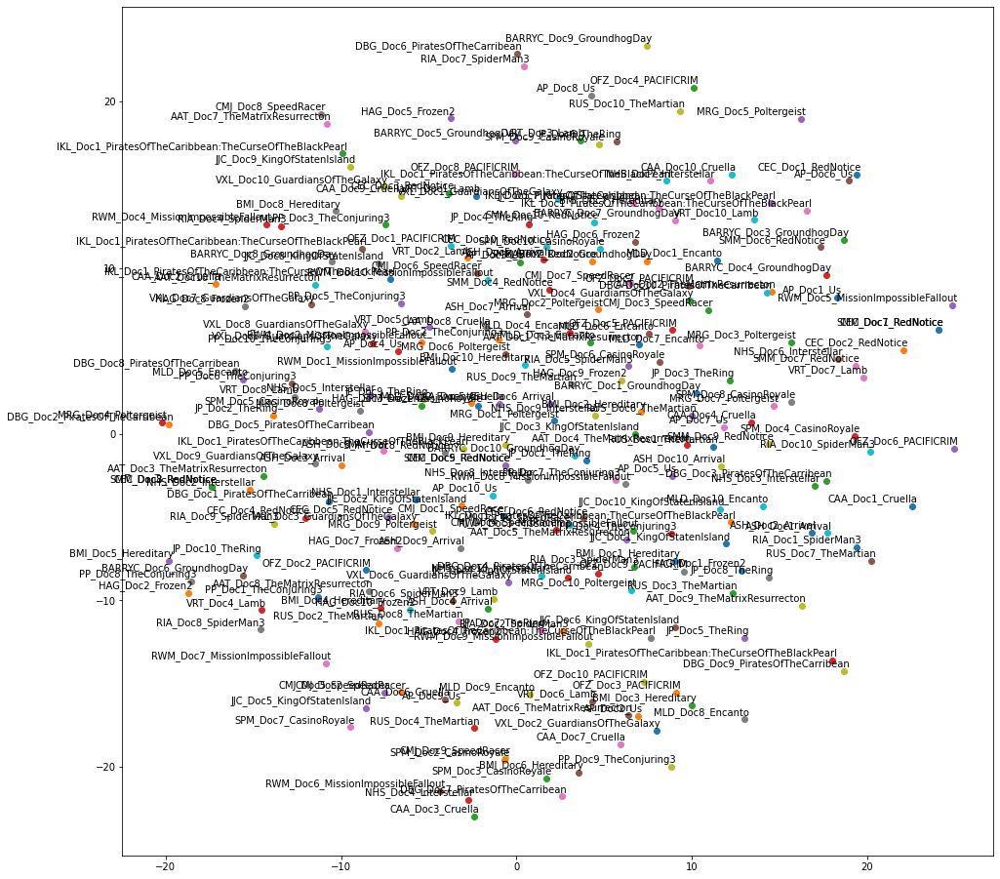

In [55]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [56]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

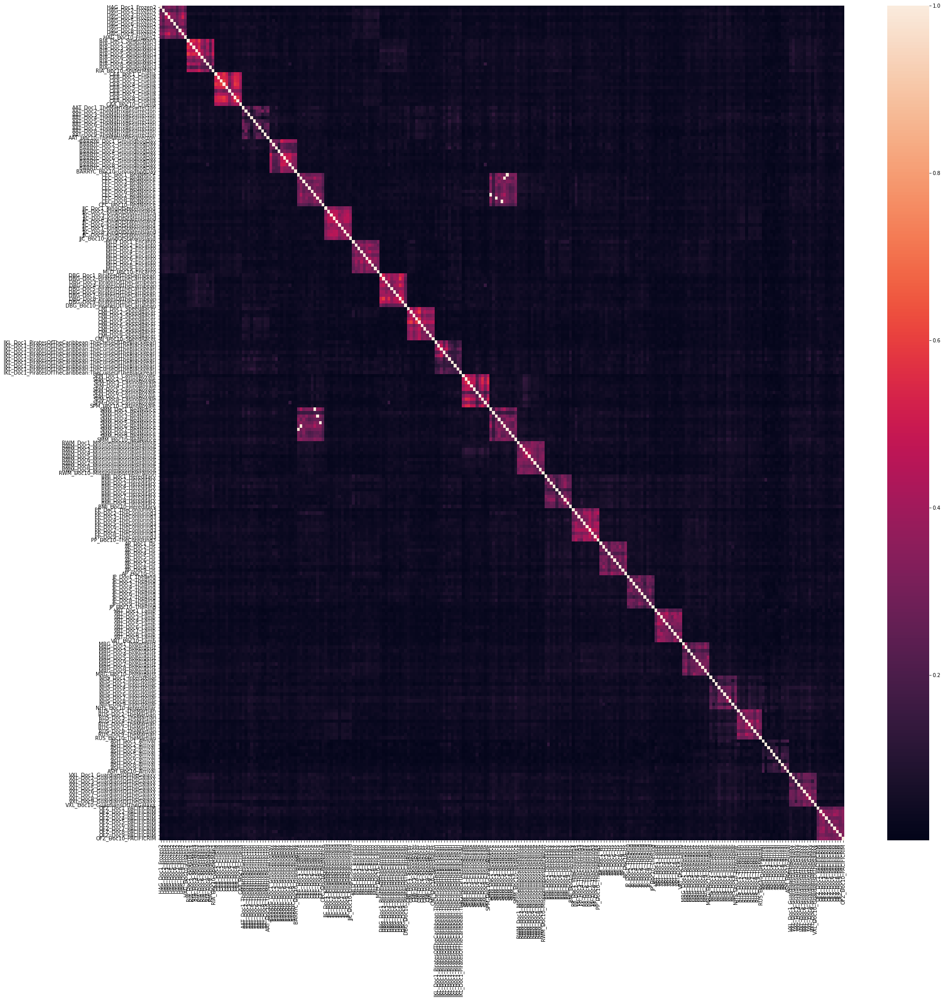

In [57]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [58]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

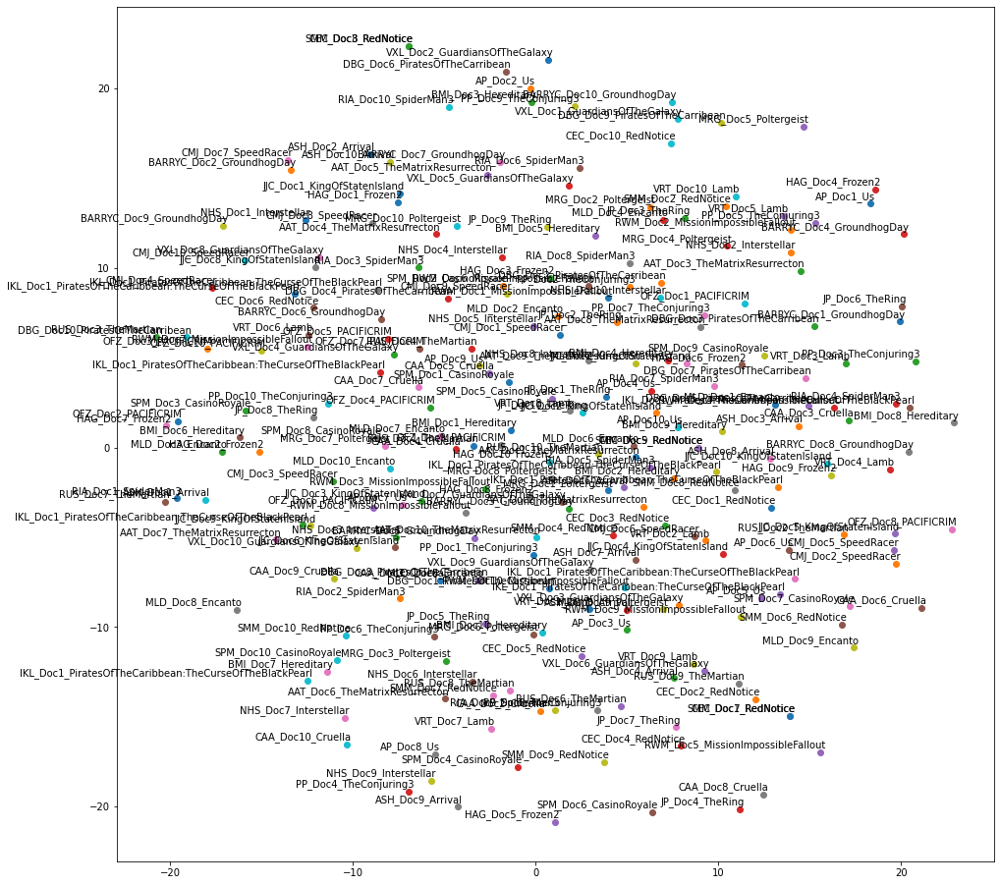

In [59]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [60]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

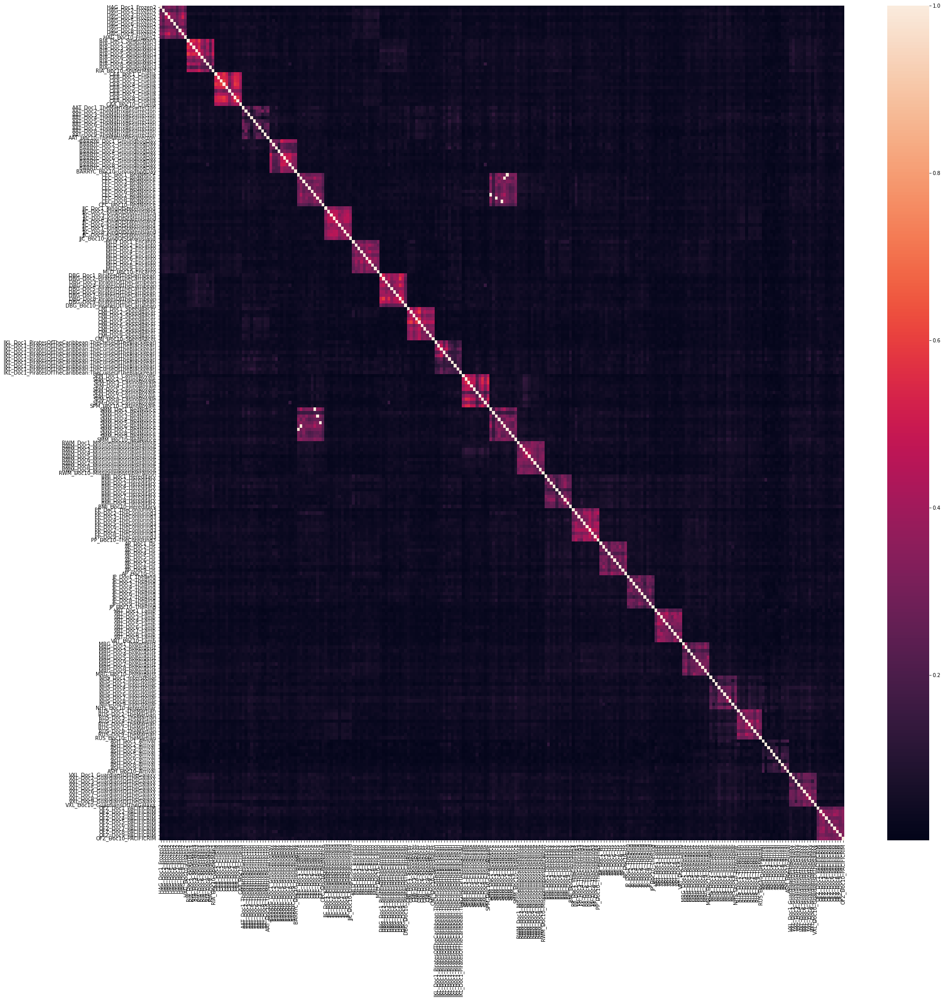

In [61]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [62]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [63]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

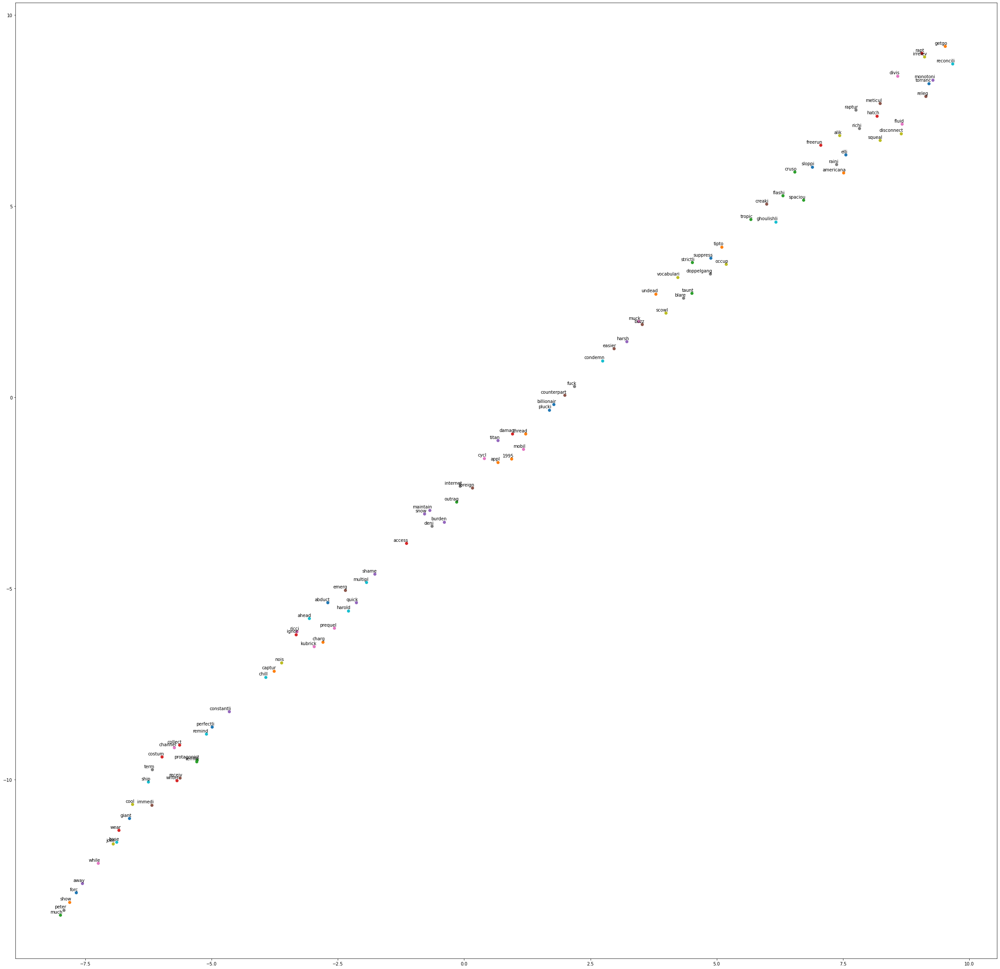

CPU times: user 2.57 s, sys: 127 ms, total: 2.7 s
Wall time: 2.24 s


In [64]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [65]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
abduct,-0.010058,0.058550,-0.075355,-0.168661,-0.039162,0.034304,-0.008206,-0.004321,0.112525,0.050488,0.078842,-0.049949,0.150607,-0.026066,0.031220,0.016079,0.014083,-0.147627,0.045994,0.029825,0.105867,0.018066,-0.000837,0.034455,-0.016294,0.004891,0.016801,-0.085767,0.021634,-0.001311,-0.089959,0.052619,0.024470,0.086910,-0.043678,0.040091,-0.043208,0.083083,-0.044923,0.061507,...,-0.087288,-0.032942,0.075205,0.021404,-0.014737,0.019146,0.044876,0.034874,-0.019356,0.063874,0.072137,-0.058675,0.076590,0.025075,0.031599,0.055944,-0.002961,-0.045436,0.036044,-0.053694,0.186306,0.025190,-0.056937,0.007340,0.062066,-0.046198,0.046878,0.036459,-0.011494,0.040144,0.093731,-0.041568,-0.003329,-0.048866,0.055612,0.128790,0.139741,0.036195,-0.017719,-0.024280
charg,-0.015458,0.062209,-0.079300,-0.187641,-0.045089,0.045656,-0.007844,-0.011811,0.123768,0.062109,0.087188,-0.053632,0.167530,-0.029489,0.040419,0.016248,0.017435,-0.168858,0.045281,0.035479,0.108668,0.021633,-0.002062,0.040078,-0.026701,-0.000053,0.023853,-0.098090,0.023178,-0.000097,-0.099685,0.063919,0.022367,0.103558,-0.049620,0.042032,-0.052714,0.095419,-0.055339,0.067428,...,-0.094886,-0.031544,0.079808,0.015875,-0.018542,0.029750,0.051298,0.041245,-0.018543,0.074543,0.073746,-0.061618,0.085964,0.026121,0.029971,0.058284,-0.002472,-0.054701,0.037564,-0.060445,0.201132,0.019413,-0.068612,0.008571,0.068619,-0.043481,0.059146,0.040005,-0.006796,0.045123,0.106151,-0.046209,-0.011632,-0.047962,0.067377,0.144702,0.162838,0.037055,-0.017944,-0.024502
cruso,0.002642,0.014169,-0.013928,-0.043236,-0.007778,0.009914,0.001804,0.002729,0.022603,0.011776,0.014231,-0.014723,0.034113,-0.008203,0.003401,0.002191,0.006792,-0.039736,0.008152,0.002087,0.026366,0.004029,0.002543,0.010942,-0.003595,0.005011,0.005484,-0.024940,0.001586,-0.000361,-0.024068,0.017430,0.006304,0.023202,-0.013212,0.006877,-0.005978,0.023836,-0.011112,0.010490,...,-0.021643,-0.006271,0.016426,-0.000444,-0.000351,0.010460,0.008935,0.012697,-0.006260,0.014540,0.012434,-0.014539,0.013680,0.003080,0.004918,0.013688,-0.005168,-0.006145,0.010349,-0.015718,0.040519,0.001835,-0.015326,-0.001448,0.014441,-0.006196,0.013842,0.010876,-0.003079,0.012001,0.020683,-0.013780,0.003341,-0.008700,0.014783,0.027451,0.033405,0.003127,0.000079,-0.002767
freerun,0.001191,0.007652,-0.012895,-0.037649,-0.004298,0.007361,0.003486,-0.006245,0.024451,0.013497,0.019567,-0.012100,0.037486,-0.007307,0.006397,0.003253,0.000112,-0.035416,0.012731,0.010626,0.022616,0.004859,0.003460,0.008513,-0.003024,0.004813,0.000629,-0.020255,0.007397,-0.003822,-0.017804,0.007200,0.000502,0.024005,-0.010171,0.010684,-0.012740,0.019650,-0.006215,0.013909,...,-0.023602,-0.004001,0.011355,0.003944,-0.006799,0.004549,0.013759,0.008097,-0.006060,0.009480,0.010700,-0.010316,0.017067,0.001232,0.001808,0.012696,0.002913,-0.007274,0.007920,-0.014661,0.042974,0.003883,-0.010294,0.004283,0.015551,-0.011638,0.010643,0.011018,0.001207,0.013043,0.019911,-0.009197,-0.000149,-0.010333,0.016121,0.028682,0.026614,0.003203,-0.005170,-0.003628
away,-0.042178,0.255111,-0.344367,-0.780105,-0.202283,0.176256,-0.020051,-0.032221,0.513035,0.240130,0.383478,-0.238443,0.717054,-0.141097,0.165007,0.084612,0.053208,-0.690925,0.196865,0.132223,0.467004,0.084386,-0.017159,0.163204,-0.092466,0.004670,0.087575,-0.414936,0.079102,-0.009405,-0.418287,0.248743,0.095484,0.420457,-0.190868,0.189069,-0.206096,0.405001,-0.225568,0.289774,...,-0.410806,-0.147381,0.346540,0.076281,-0.091890,0.107752,0.219841,0.155875,-0.089296,0.298872,0.314494,-0.276502,0.339510,0.119605,0.145425,0.233588,-0.010336,-0.203499,0.163355,-0.271665,0.851528,0.102101,-0.281338,0.019419,0.284225,-0.198497,0.243358,0.161124,-0.037606,0.182499,0.458218,-0.187031,-0.032432,-0.217008,0.270279,0.6

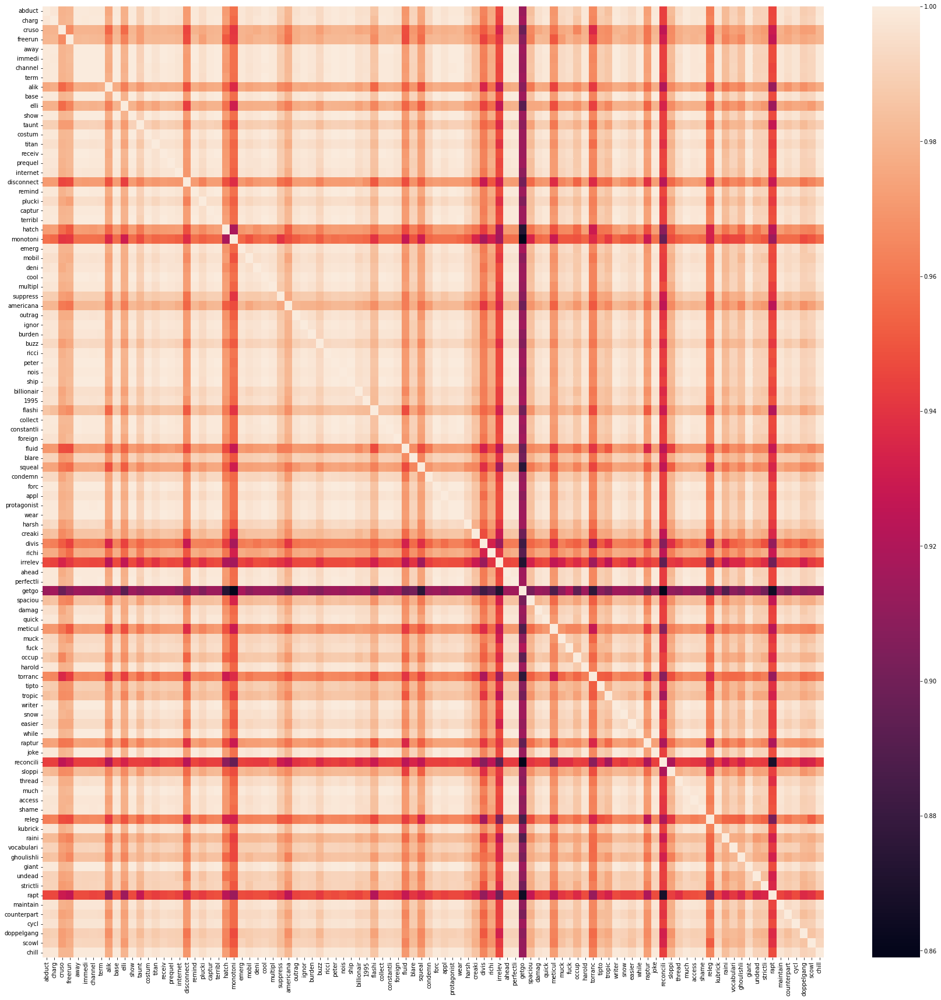

In [66]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [67]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [68]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

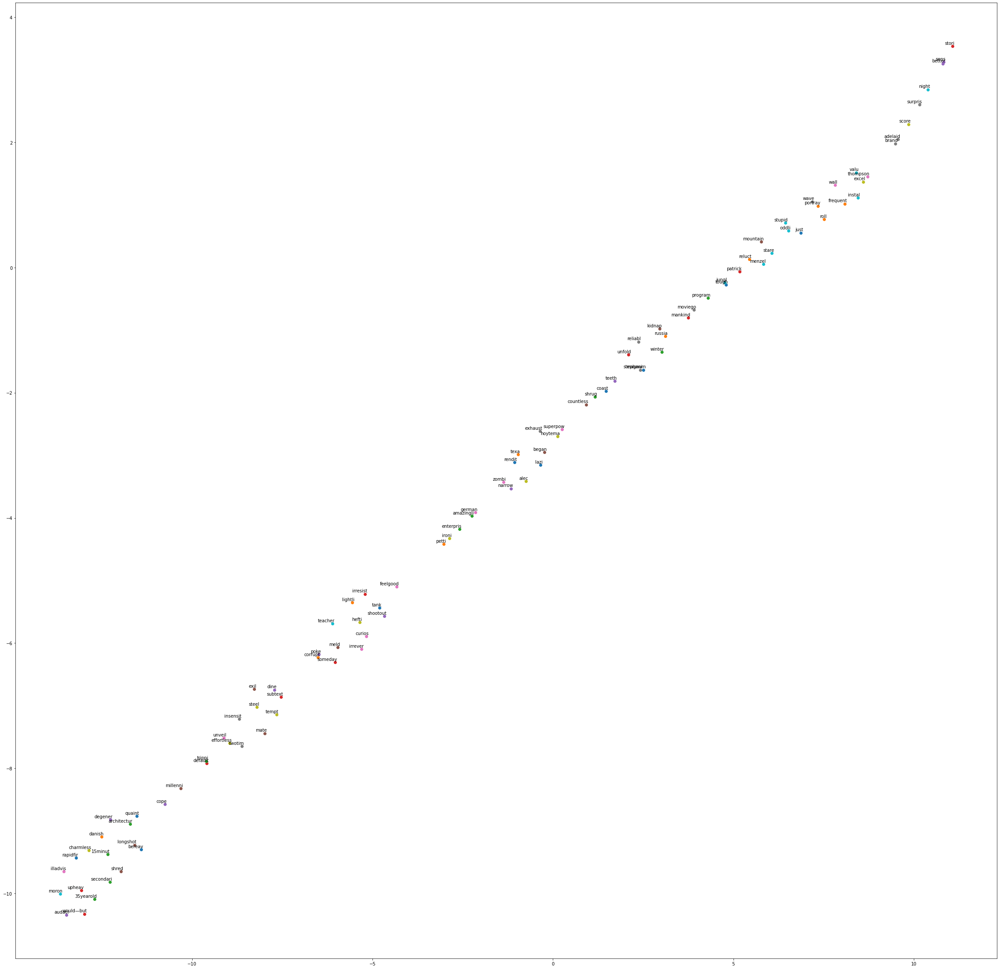

CPU times: user 2.53 s, sys: 159 ms, total: 2.69 s
Wall time: 2.18 s


In [69]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

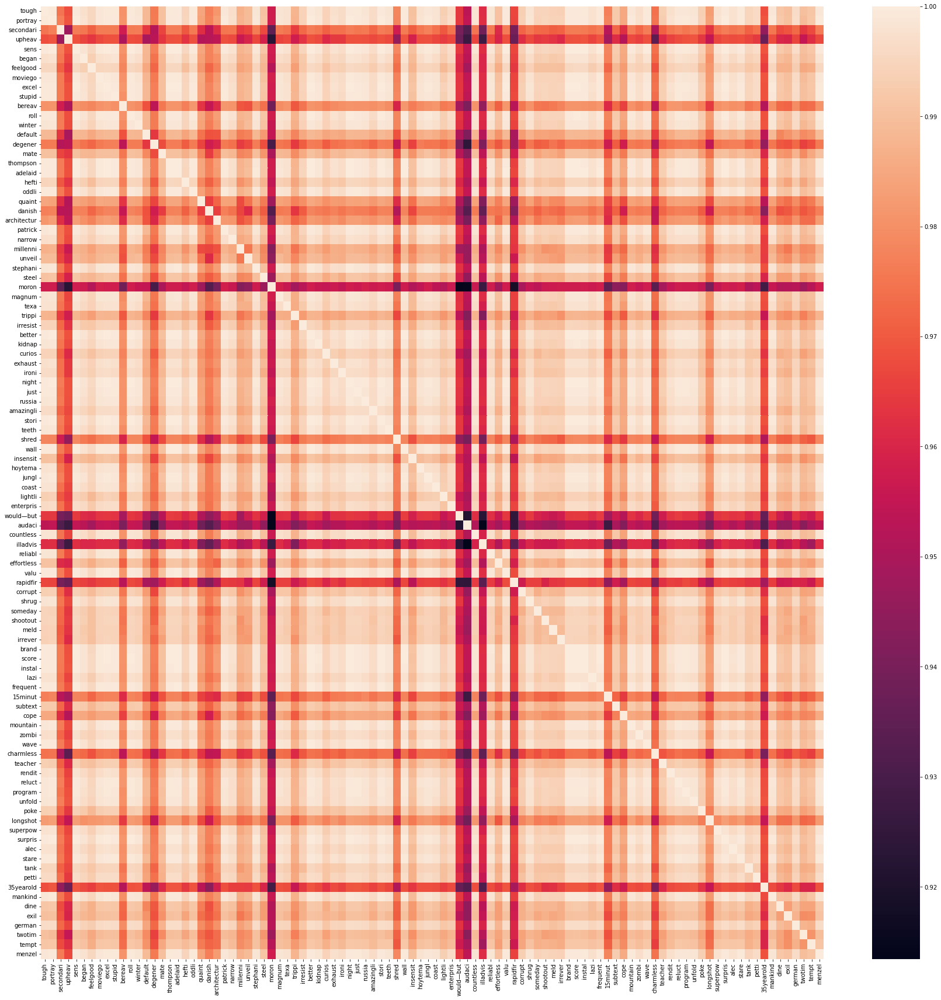

In [70]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [71]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [72]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

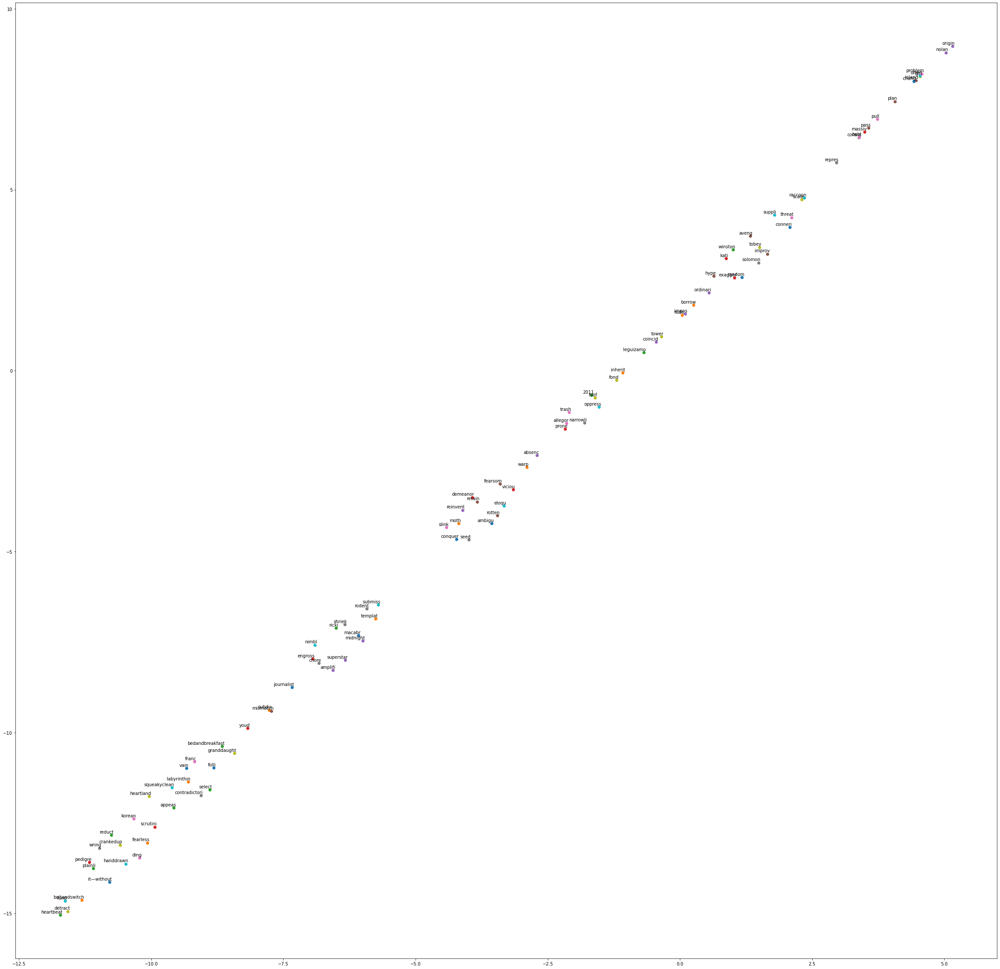

CPU times: user 2.69 s, sys: 195 ms, total: 2.89 s
Wall time: 2.35 s


In [73]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

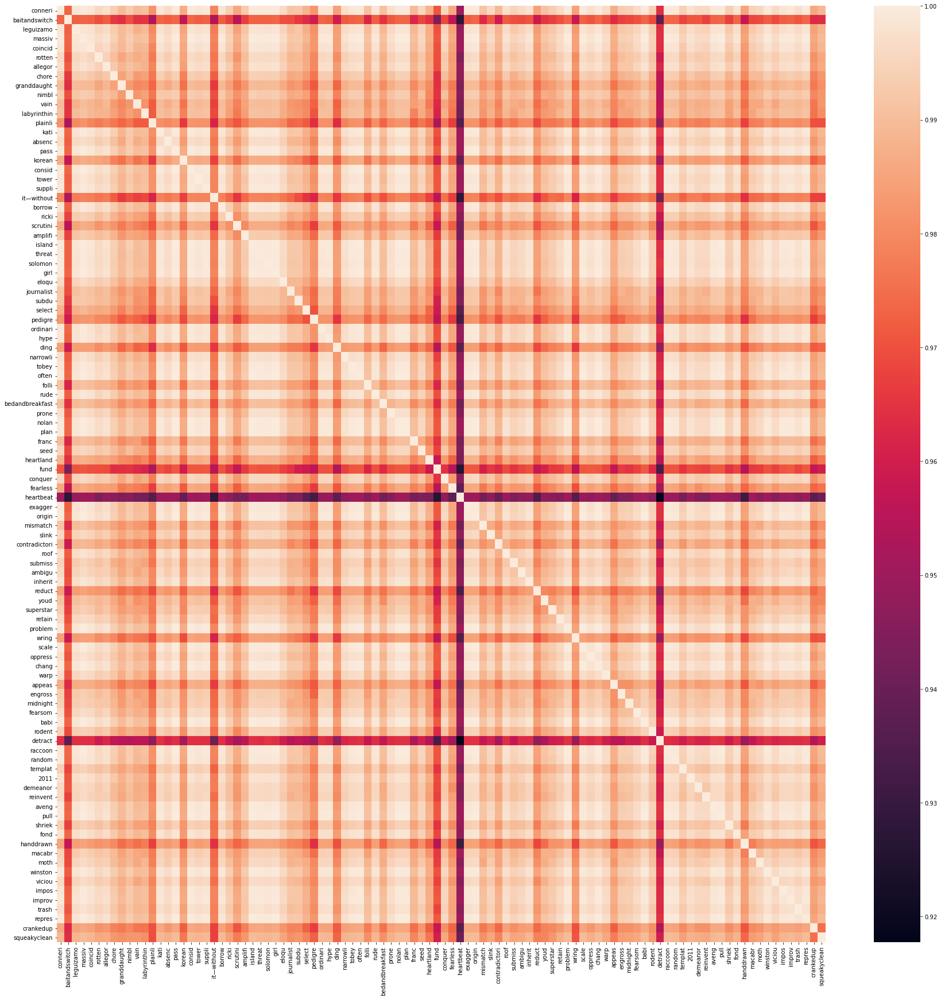

In [74]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

# Method 3 Experiments



## Data wrangling
baseline = tokenization + normalization + lemmatization + stop words + remove non-alphabetic tokens

### Functions for pre-processing

In [75]:
def clean_doc(doc): 
    #split document into individual words
    doc = ' '.join(remove_stop_words(doc))
    doc = apply_lemmatization(doc)

    tokens=doc.split()
    re_punc = re.compile('[%s]' % re.escape(string.punctuation))
    # remove punctuation from each word
    tokens = [re_punc.sub('', w) for w in tokens]
    # remove remaining tokens that are not alphabetic
    #tokens = [word for word in tokens if word.isalpha()]
    # filter out short tokens
    tokens = [word for word in tokens if len(word) > 3]
    #lowercase all words
    tokens = [word.lower() for word in tokens]
    
    return tokens

### Pre-process data set

In [76]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/')
path_to_file='ClassCorpus.csv'
data = pd.read_csv(path_to_file)

In [77]:
#process documents
titles, final_processed_text, processed_text = process_corpus(data)
print(final_processed_text[0])

parents breathe sigh relief frozen showstopper into unknown isnt aggressive earworm lyrically complex high note kind thatll break eardrum sung anyone isnt idina menzel hard imagine full howling delicate scale hour upon hour frozen disneys sequel 13bn mature ambitious intricate predecessor that doesnt automatically make better frozens success built simple relatable story sisterly love different enough feel like stale rerun there surprise uncover renewed sense energy proceeding admittedly film play fire taking path sequel padding character backstory hope itll depth world there echo last month maleficent mistress evil queen elsa menzel carted magical place might provide answer come frozen succeeds many others failed sentient snowman olaf josh neatly summarises scene elsa made peace power frozen discovered love rule arendelle anna kristen bell boyfriend kristoff jonathan groff provide sense domestic normalcy weekly charade session that mysterious female voice provided norwegian singer auro

##Document Vectorization using tf-idf

### Retrieve Word Count Frequencies

In [78]:
vectorizer = CountVectorizer(ngram_range = (1,1))
matrix=vectorizer.fit_transform(text)     

#creating datafram from TFIDF Matrix
words = vectorizer.get_feature_names()
matrix=pd.DataFrame(matrix.toarray(), columns=vectorizer.get_feature_names(), index=titles)
frequencies = matrix.sum().transpose().reset_index()
frequencies.columns = ['word', 'counts']
frequencies.head(10)

,word,counts
0,00,2
1,000,2
2,007,20
3,007s,1
4,10,35
5,100,7
6,1000,1
7,1000000,1
8,101,10
9,103,1


### Calculates TFIDF and Saves TFIDF Values for Terms

In [79]:
vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, norm=None)
transformed_documents = vectorizer.fit_transform(text)
transformed_documents_as_array = transformed_documents.toarray()

output_dir ="TFIDF_output.csv"

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for counter, doc in enumerate(transformed_documents_as_array):
    # construct a dataframe
    tf_idf_tuples = list(zip(vectorizer.get_feature_names(), doc))
    one_doc_as_df = pd.DataFrame.from_records(tf_idf_tuples
                                              ,columns=['term', 'score']).sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # output to a csv using the enumerated value for the filename
    one_doc_as_df.to_csv(output_dir+"/"+str(titles[counter]))
    

In [80]:
os.chdir('/content/drive/My Drive/Colab Notebooks/MSDS453/Assignment 1/TFIDF_output.csv/')

top_term_scores().head(10)

,Term,Score
1615,guardians,20.576739
112,ideological,20.540666
1614,galaxy,14.752990
113,formulaic,14.736069
1386,marvel,14.452042
1746,quill,13.594155
594,prologue,12.656627
326,flying,12.656627
114,values,12.370697
1619,orb,11.891650


## Documents by Embedding Matrix

### 100 Embedding Dimensions

In [81]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 100)

#### Plot doc2vec TSNE 

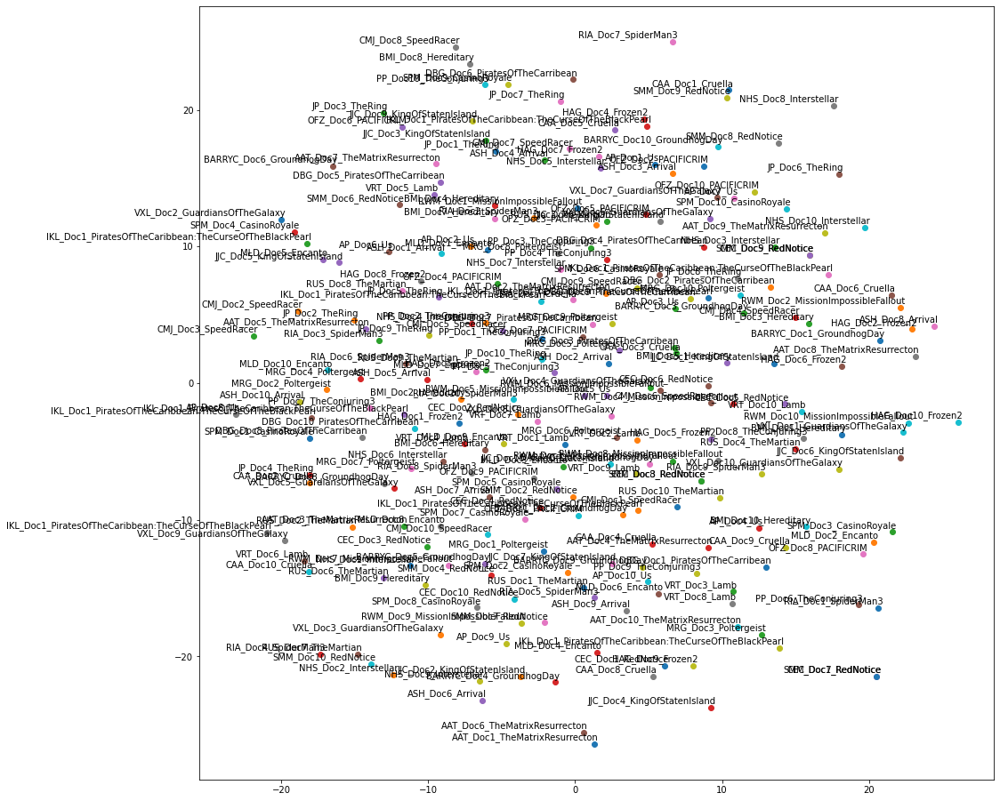

In [82]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [83]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

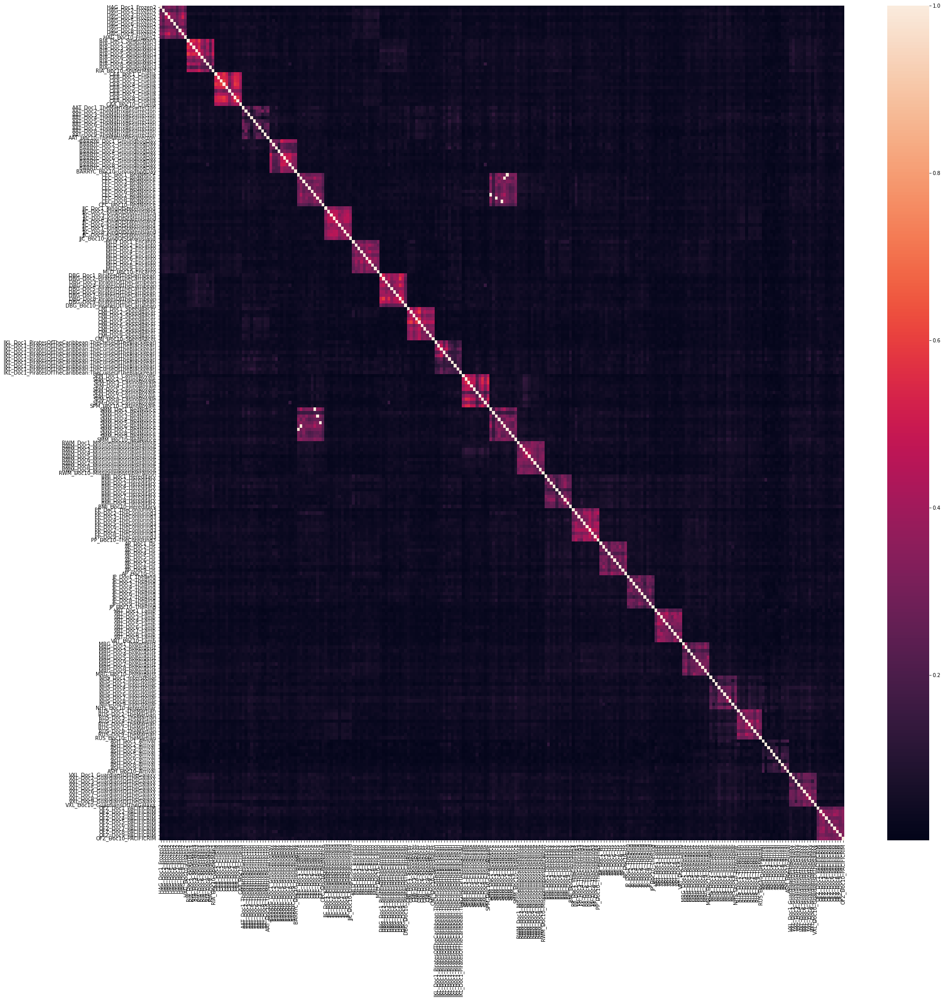

In [84]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 200 Embedding Dimensions

In [85]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 200)

#### Plot doc2vec TSNE 

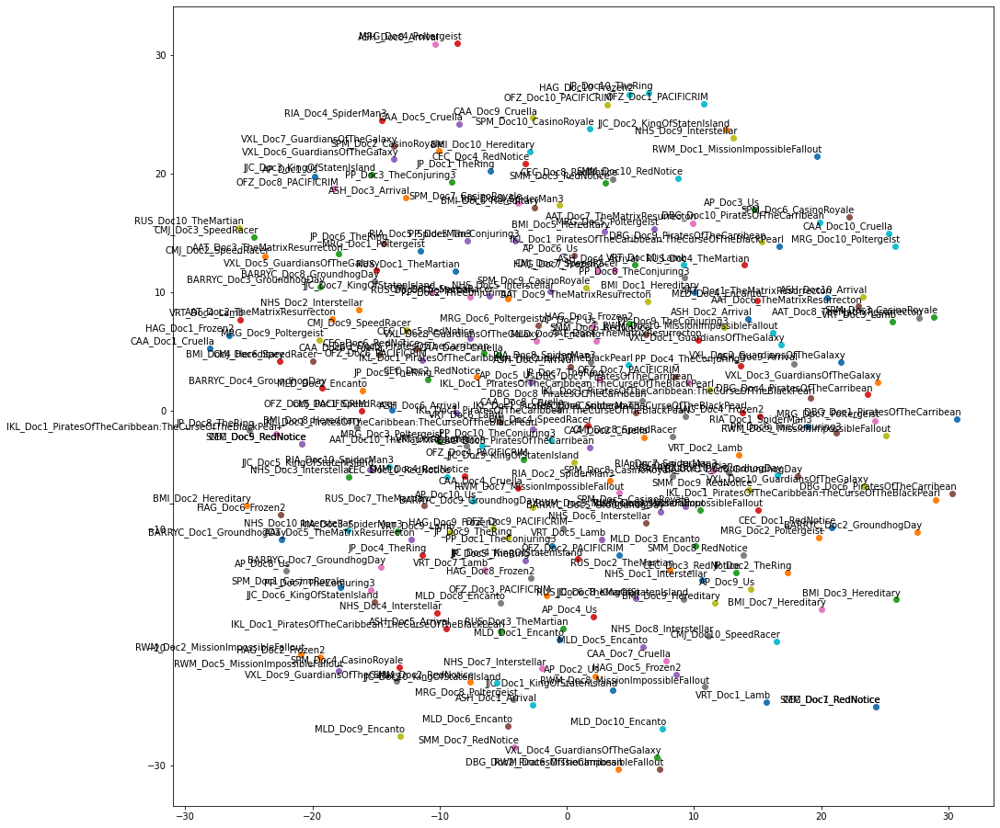

In [86]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [87]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

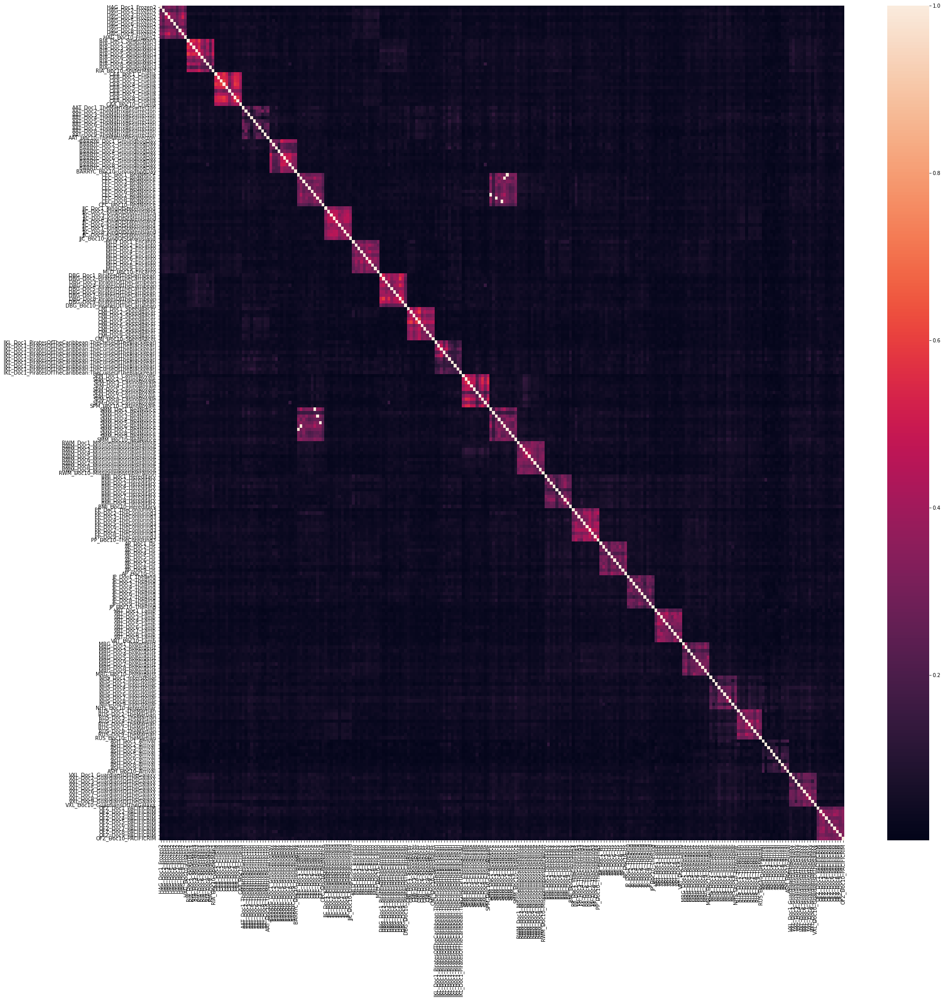

In [88]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

### 300 Embedding Dimensions

In [89]:
doc2vec_df = run_doc2vec(final_processed_text, processed_text, 300)

#### Plot doc2vec TSNE 

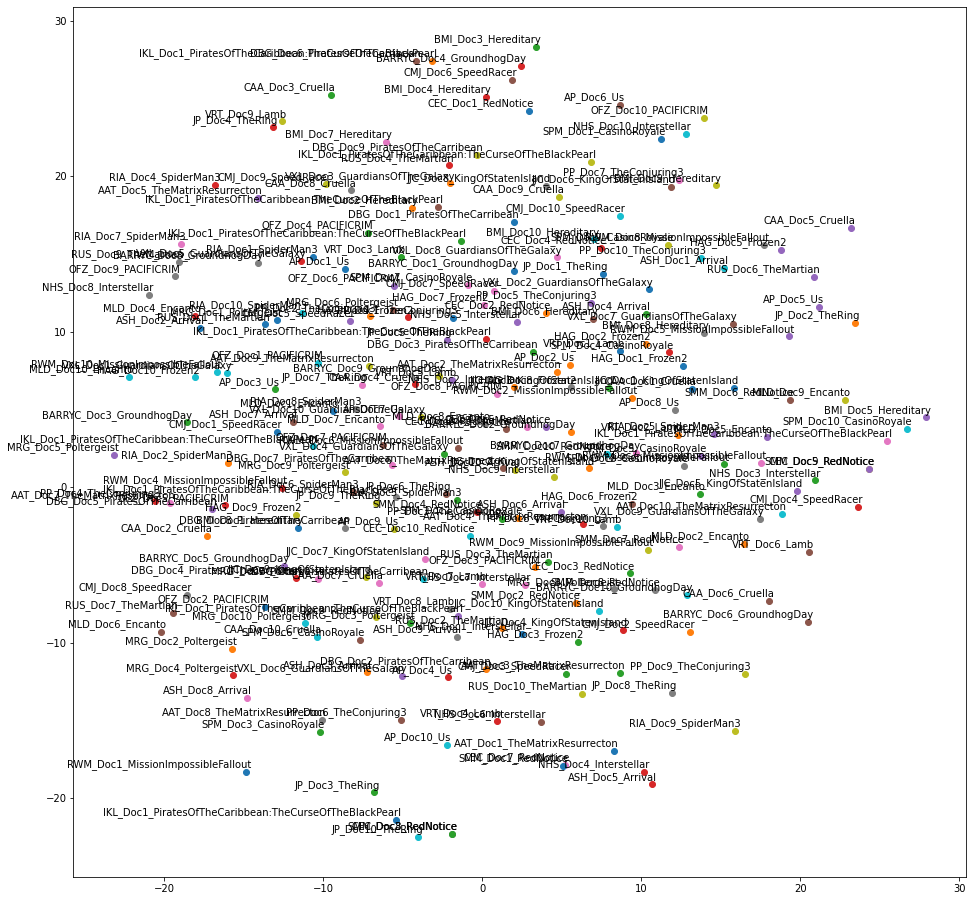

In [90]:
plot_doc2vec(doc2vec_df, titles,15)

#### Plot Heatmap of Cosine Similarity of Documents using TFIDF matrix

In [91]:
doc_term_matrix = transformed_documents.todense()
df = pd.DataFrame(doc_term_matrix, 
                      columns=vectorizer.get_feature_names(), 
                      index=docids)

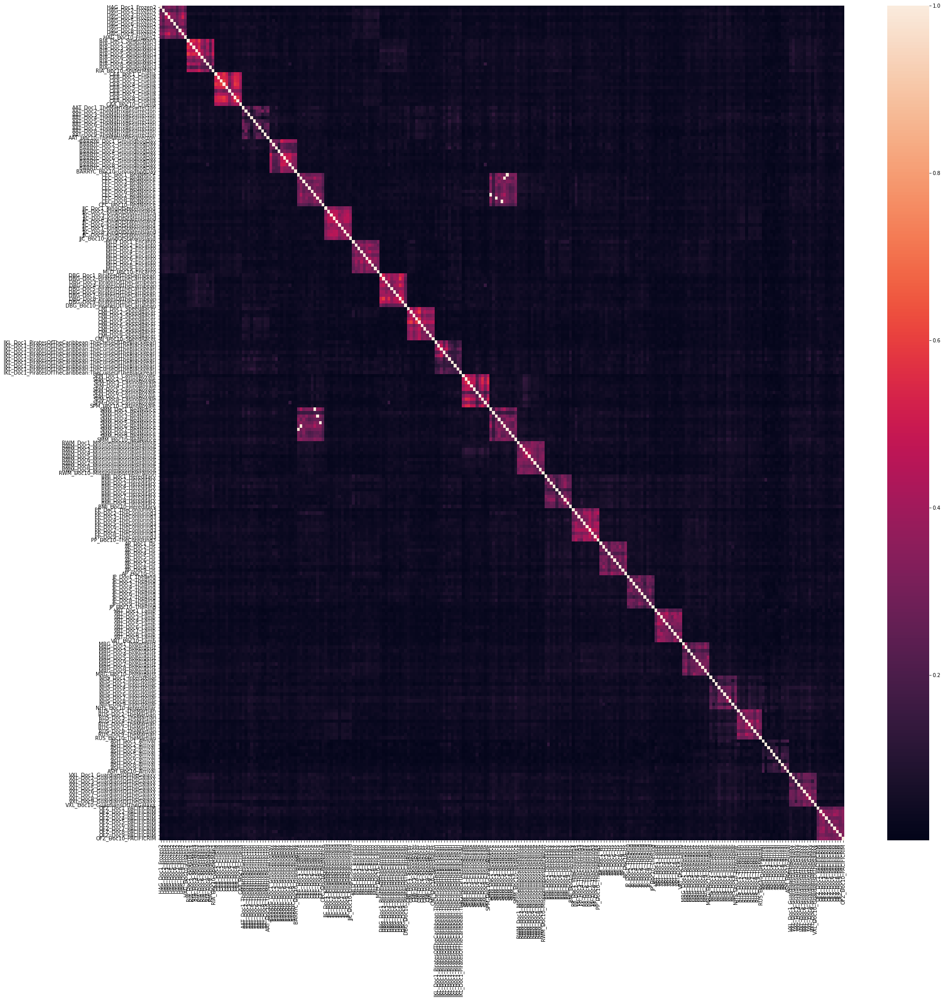

In [92]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels= titles, yticklabels=titles);

##Terms by Embedding Matrix

### 100 Embedding Dimensions

In [93]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 100)

#### Plot word2vec TSNE

In [94]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

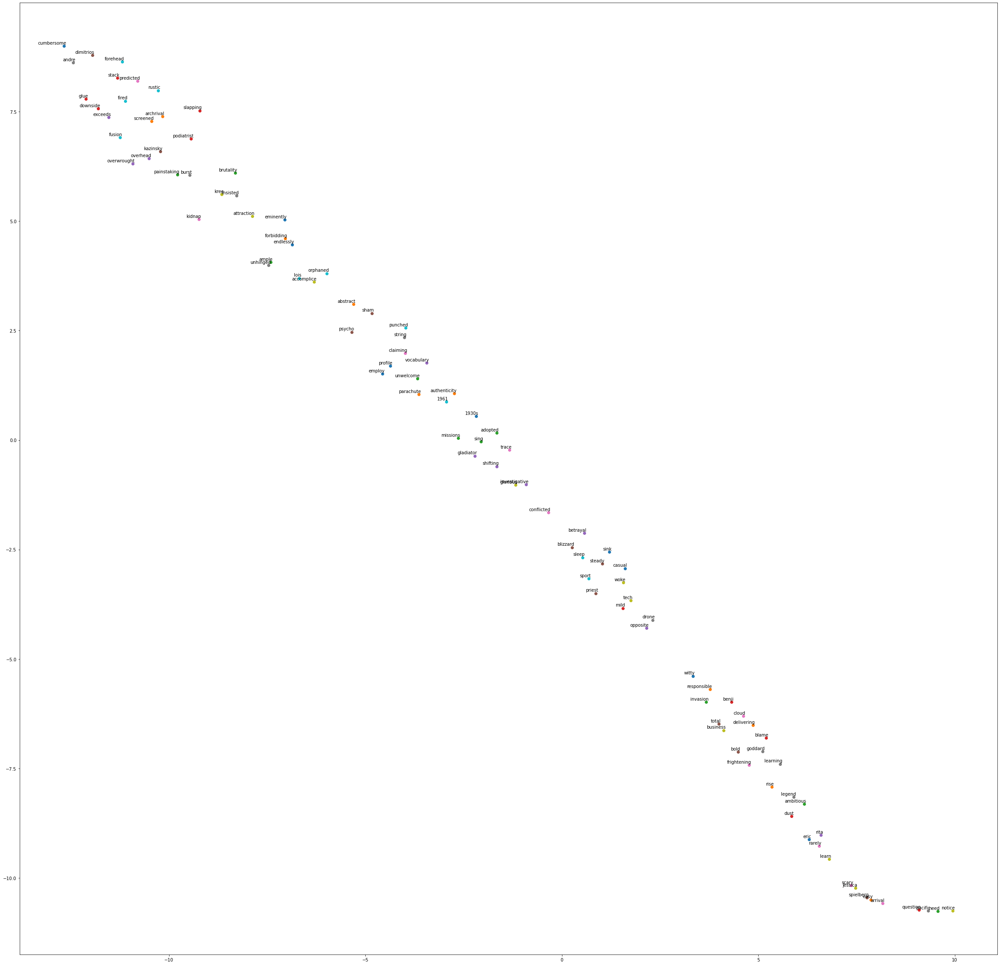

CPU times: user 2.51 s, sys: 149 ms, total: 2.66 s
Wall time: 2.18 s


In [95]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

In [96]:
df = pd.DataFrame(weights, index=random_labels)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
employ,0.003651,0.009694,-0.021739,-0.026454,-0.000164,-0.003489,-0.005871,0.008483,0.017584,0.010600,0.013405,0.007634,0.029073,-0.018813,0.030599,0.002176,0.016602,-0.019467,0.010560,0.007455,0.021788,0.013100,0.009193,0.026653,-0.007047,-0.010535,-0.006328,-0.015358,-0.003664,0.009046,-0.028699,0.013950,0.014497,0.017605,-0.020920,0.014698,-0.011330,0.020551,-0.006509,0.014933,...,-0.022617,-0.015939,0.010348,-0.001760,-0.000445,0.009184,-0.005807,0.017694,0.005294,0.013317,0.005627,-0.013439,0.014442,0.020329,0.000261,0.006717,-0.004262,-0.013490,0.020451,-0.022031,0.042217,0.007308,-0.000299,-0.004193,0.015518,0.007818,0.030269,-0.008166,-0.014106,0.009480,0.020220,-0.002461,-0.000686,-0.000426,0.021591,0.017010,0.020366,-0.016913,-0.004345,-0.009283
easy,0.063794,0.083917,-0.205472,-0.179827,0.014842,0.002938,-0.010255,0.044950,0.153227,0.062797,0.133928,0.035150,0.226465,-0.165948,0.194000,0.053333,0.110547,-0.162862,0.100489,0.095499,0.152757,0.116510,0.058448,0.197928,-0.044242,-0.068715,-0.030122,-0.080408,0.008969,0.063708,-0.196938,0.104987,0.082319,0.159344,-0.175432,0.079424,-0.079855,0.147974,-0.036467,0.106570,...,-0.198873,-0.095471,0.045497,0.012085,0.002193,0.095552,-0.053519,0.105186,0.001552,0.101664,0.020790,-0.126437,0.085785,0.162080,-0.030556,0.016922,-0.022362,-0.118617,0.120420,-0.141130,0.310409,0.024090,-0.027433,-0.045845,0.082482,0.025152,0.232849,-0.063768,-0.098170,0.041143,0.177059,0.004811,0.007908,0.004511,0.131608,0.114931,0.151843,-0.109621,-0.014510,-0.071514
invasion,0.016520,0.031134,-0.066391,-0.057912,0.006944,-0.005269,-0.003671,0.012218,0.056044,0.020847,0.046370,0.011570,0.071425,-0.055763,0.061971,0.021199,0.033918,-0.052812,0.031158,0.035385,0.056308,0.042739,0.020685,0.063129,-0.018572,-0.025780,-0.004770,-0.024371,-0.001754,0.023886,-0.065764,0.038130,0.025254,0.055113,-0.058096,0.024348,-0.023744,0.052856,-0.007764,0.038931,...,-0.071118,-0.035253,0.014106,0.008219,-0.000854,0.027136,-0.023951,0.030132,-0.001273,0.037840,0.005772,-0.044465,0.032219,0.052633,-0.012766,0.001839,-0.003771,-0.040608,0.040111,-0.047357,0.102682,0.011164,-0.006002,-0.011381,0.029089,0.012850,0.077074,-0.024065,-0.031341,0.017475,0.061927,-0.003165,0.003592,0.004194,0.041058,0.037339,0.046328,-0.037336,-0.004750,-0.029950
slapping,0.006681,0.008797,-0.015549,-0.011750,0.001487,0.001414,-0.000129,0.002202,0.006944,0.003417,0.014443,0.007215,0.013106,-0.014731,0.015810,-0.000791,0.012699,-0.013871,0.005199,0.008653,0.008417,0.012517,0.001499,0.014594,-0.006298,-0.001499,0.001441,-0.009150,-0.001758,0.006688,-0.012543,0.008654,0.006521,0.008328,-0.009258,0.001420,-0.008021,0.008971,-0.005793,0.004229,...,-0.018431,-0.011673,0.005435,-0.003542,-0.003458,0.011116,-0.009234,0.008727,-0.003262,0.010082,-0.002982,-0.014106,0.010373,0.016197,-0.002025,-0.001642,-0.004787,-0.007783,0.004262,-0.011422,0.027597,-0.003219,0.000659,-0.006221,0.008828,-0.002410,0.017109,-0.005292,-0.008661,0.004703,0.009627,0.004646,0.001555,-0.000163,0.007121,0.004853,0.006645,-0.006073,0.002829,-0.010376
vocabulary,0.010113,0.013002,-0.030050,-0.025893,0.006514,-0.004722,-0.001107,0.005402,0.024117,0.010247,0.015189,0.009400,0.032701,-0.018768,0.024013,0.002850,0.017904,-0.022358,0.010592,0.015942,0.027065,0.016240,0.008237,0.028715,-0.004188,-0.008461,-0.005240,-0.015486,0.002141,0.008883,-0.024906,0.018168,0.009587,0.020534,-0.026669,0.006750,-0.006878,0.020514,-0.007926,0.015971,...,-0.025979,-0.008781,0.004707,0.002288,-0.002887,0.010368,-0.012269,0.010016,-0.003455,0.017426,0.003064,-0.017026,0.014354,0.020490,-0.006474,0.003262,-0.002108,-0.013584,0.019962,-0.016589,0.048236,-0.001213,-0.003016,-0.010122,0.010332,0.007966,0.035014,-0.011864,-0.009754,0.008660,0.024770,-0.001375,-0.001077,0.001

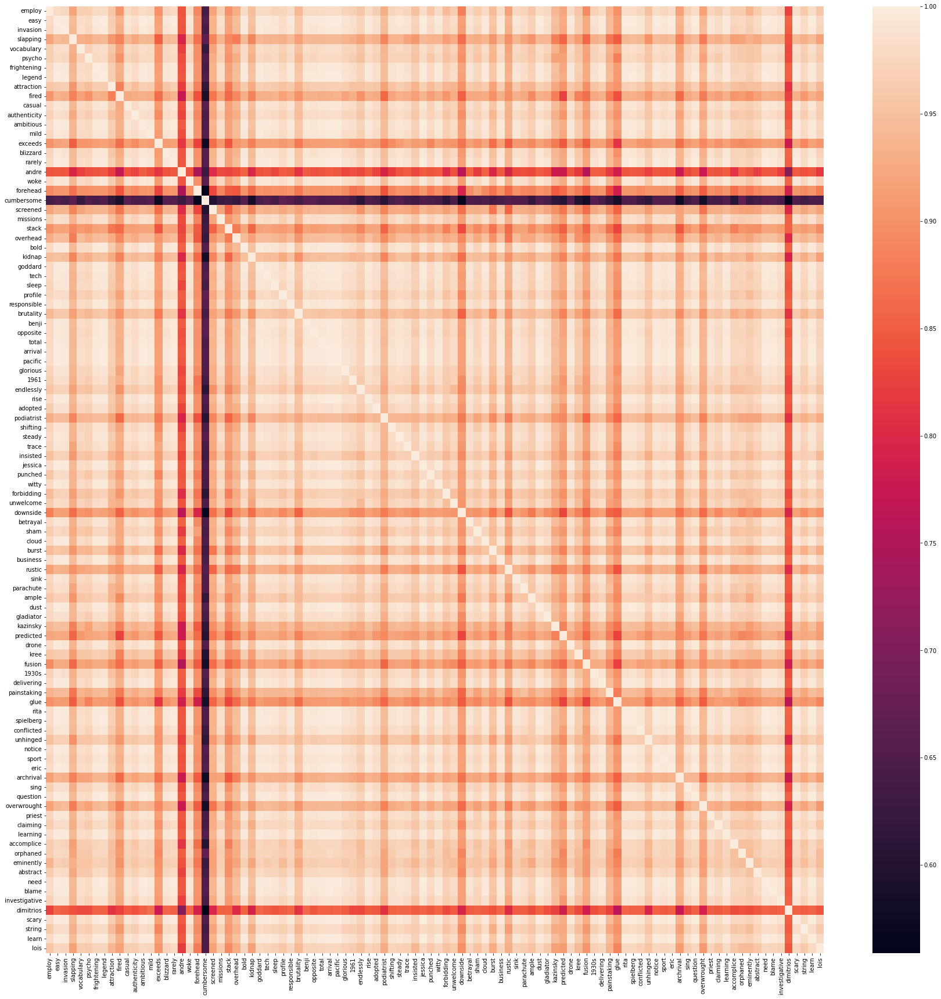

In [97]:
similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 200 Embedding Dimensions

In [98]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 200)

#### Plot word2vec TSNE

In [99]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

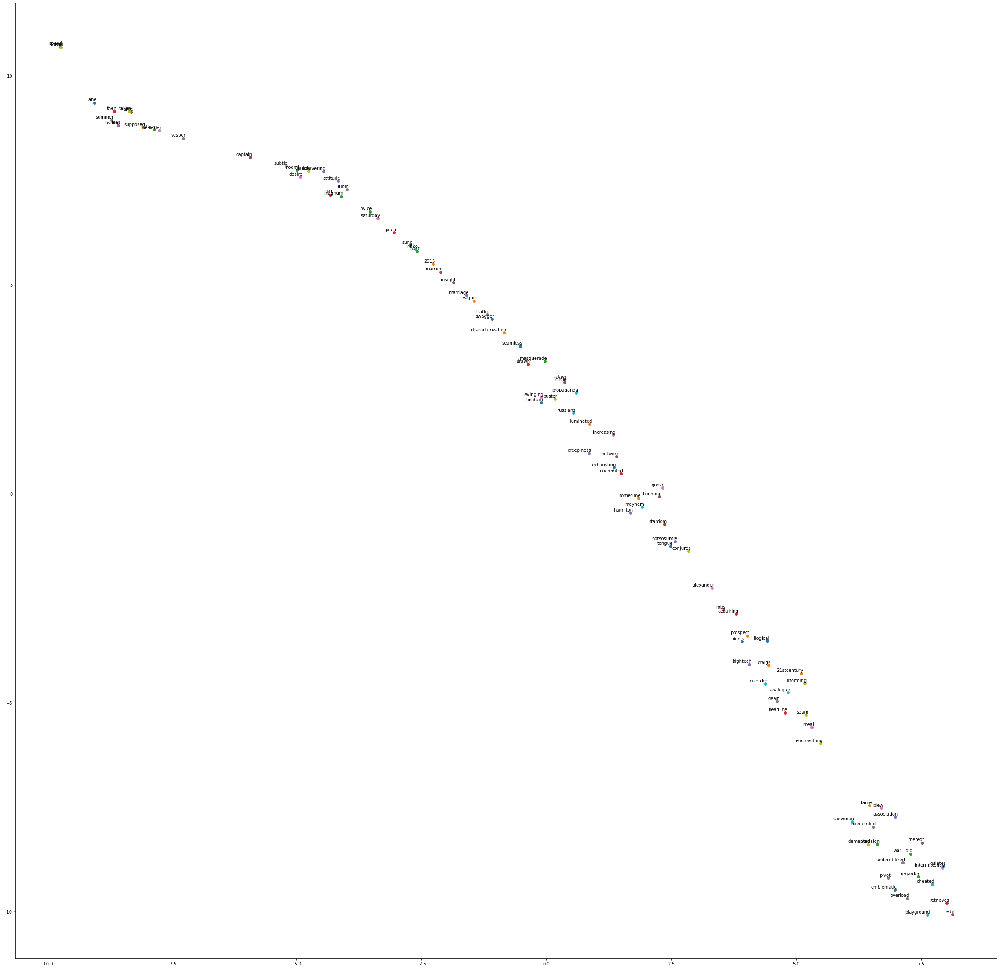

CPU times: user 2.48 s, sys: 139 ms, total: 2.62 s
Wall time: 2.16 s


In [100]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

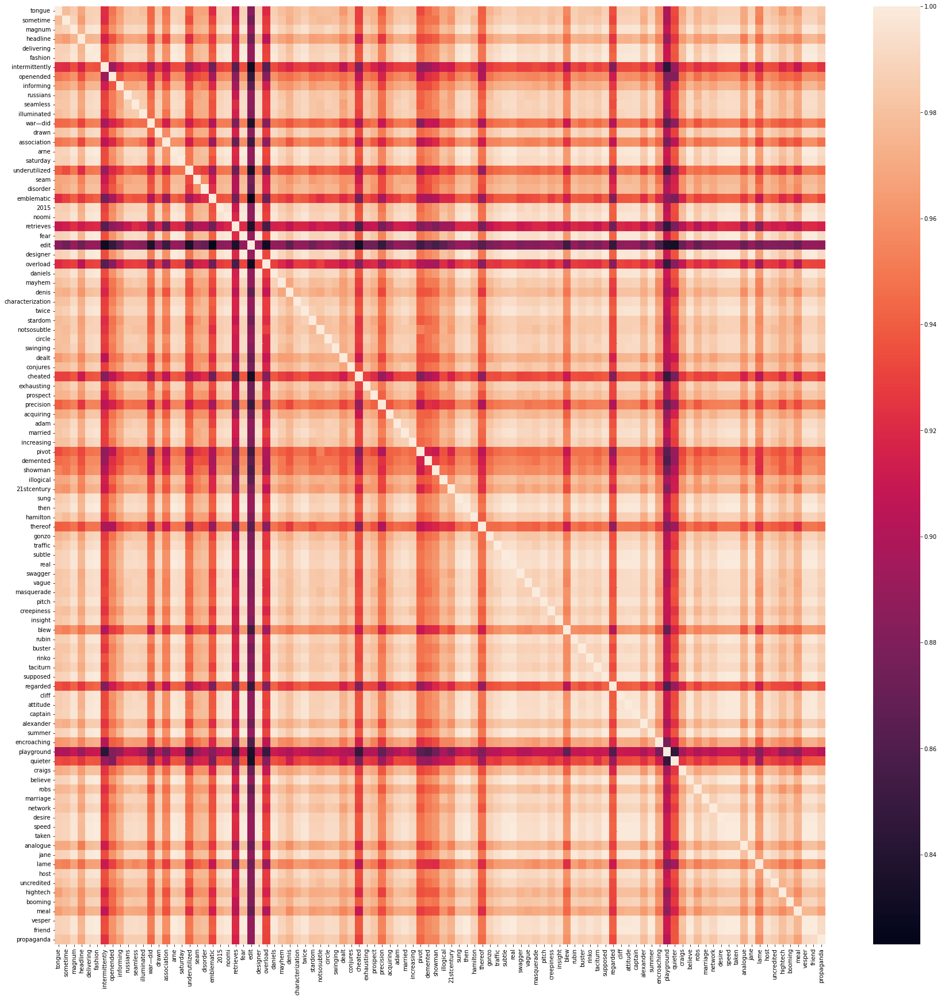

In [101]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);

### 300 Embedding Dimensions

In [102]:
titles, final_processed_text, processed_text = process_corpus(data)
labels, tokens, word2vec_model = run_word2vec(processed_text, 300)

#### Plot word2vec TSNE

In [103]:
#create random subset of 100 tokens
weights = []

random_labels = random.sample(labels, 100)

for i in random_labels:
  weights.append(word2vec_model[i])

Tokens are the embedding vectors -- the important weights/features

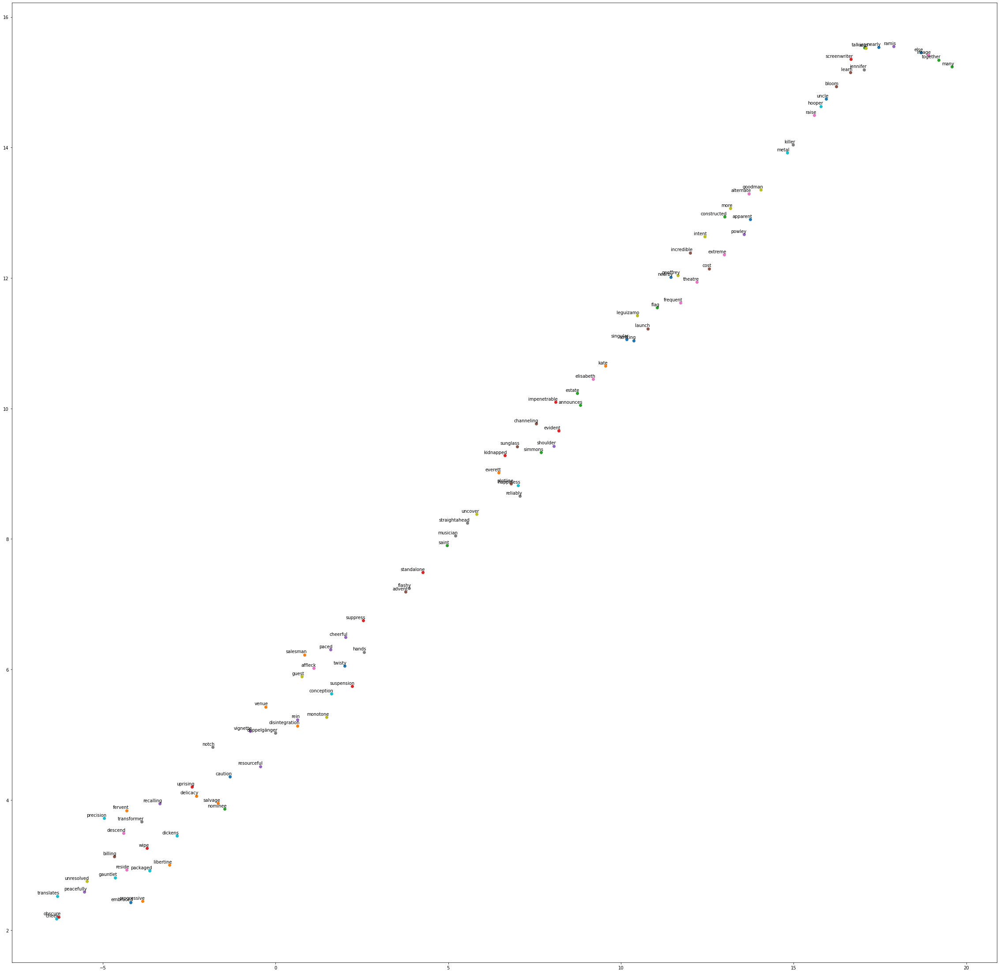

CPU times: user 3.22 s, sys: 162 ms, total: 3.39 s
Wall time: 2.54 s


In [104]:
%%time
plot_word2vec(word2vec_model, random_labels, weights, 20)

#### Plot word2vec heatmap for cosine similarity

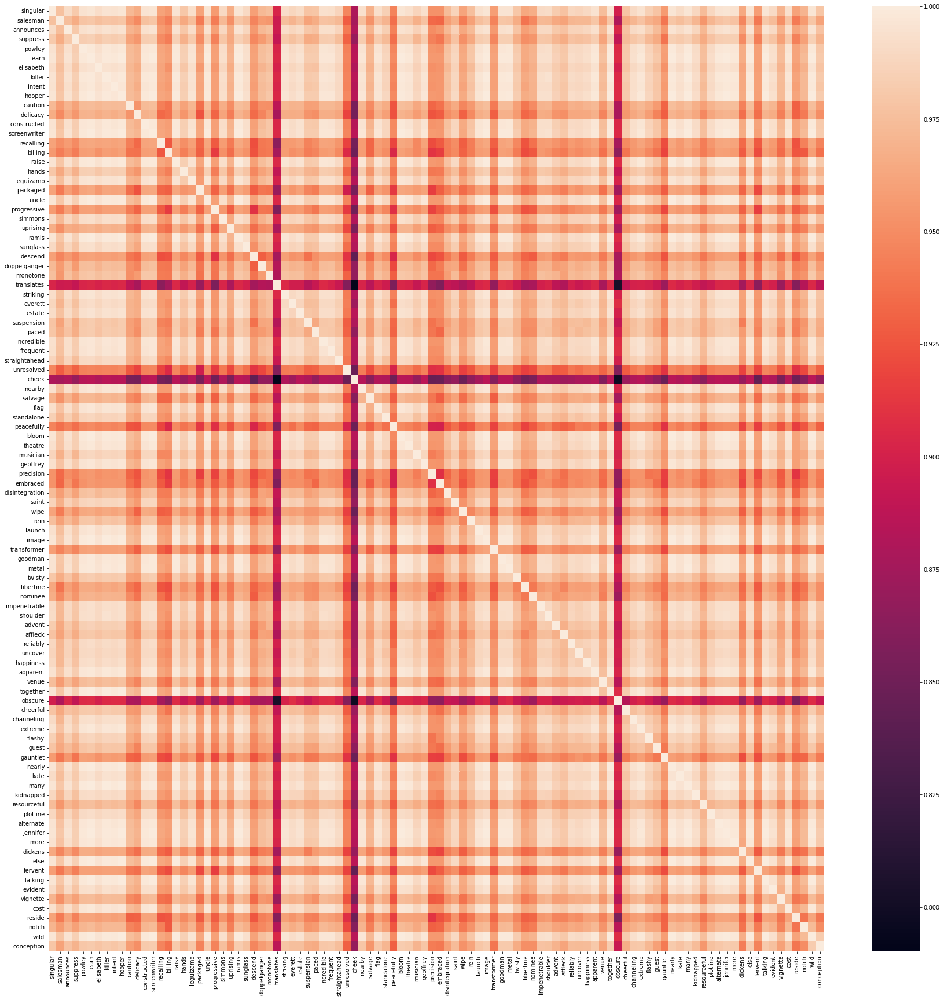

In [105]:
df = pd.DataFrame(weights, index=random_labels)

similarity  = cosine_similarity(df, df)
a4_dims = (30, 30)
fig, ax = pyplot.subplots(figsize=a4_dims)
sns.heatmap(ax=ax, data=similarity, xticklabels=random_labels, yticklabels=random_labels);